In [ ]:
import os
os.environ["OMP_NUM_THREADS"] = "20"
os.environ["MKL_NUM_THREADS"] = "20"
os.environ["NUMEXPR_NUM_THREADS"] = "20"
os.environ["OPENBLAS_NUM_THREADS"] = "20"
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchsummary import summary
from torchmetrics.image.fid import FrechetInceptionDistance
from torchvision.models import inception_v3

from sklearn.datasets import make_blobs
from matplotlib.gridspec import GridSpec
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from torch.utils.data import TensorDataset, DataLoader
import math

from torch.autograd import Variable
from torchvision.datasets import ImageFolder
from torch.amp import autocast, GradScaler
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from datetime import datetime
from IPython.display import clear_output
from tqdm.auto import tqdm
import torch.nn.functional as F


from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity


PATH = ""

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
sns.set(palette='Set2')

from IPython.display import HTML
from IPython.display import clear_output

seed = 42
import random
random.seed(seed)
torch.manual_seed(seed);

import torch
torch.set_num_threads(20)

In [2]:
import seaborn as sns
sns.set(palette='Set2', font_scale=1.3)

device = torch.device("cuda:7" if torch.cuda.is_available() else "cpu")
USE_CUDA = torch.cuda.is_available()

### Задача 2
Будем исследовать модели для трансфера стиля.

Как вы помните из лекции, самой первой моделью в данной области генеративного ИИ является [CycleGAN](https://arxiv.org/pdf/1703.10593v7.pdf) (2017). Однако прогресс не стоял на месте, и уже в следующем году появилась многообещающая модель [MUNIT](https://openaccess.thecvf.com/content_ECCV_2018/papers/Xun_Huang_Multimodal_Unsupervised_Image-to-image_ECCV_2018_paper.pdf) (2018). Авторы данной модели внедрили в CуcleGAN идею StyleGAN о возможности кодирования стиля. 

Напомним, что в CycleGAN использовалось две пары генераторов для трансфера изображения из первого домена во второй и из второго в первый соответственно, а также два дискриминатора для первого и второго доменов. В MUNIT также используется по две пары генераторов и дискриминаторов. Основное отличие состоит в том, они добавили в архитектуру модели часть с кодированием стиля.  Для этого они разделили каждый генератор на две части: кодировщик $\mathcal{E}$ и декодировщик $\mathcal{G}$.

В свою очередь кодировщик $\mathcal{E}$ также состоит из двух частей $\mathcal{E}^c$ и $\mathcal{E}^s$, которые преобразует входное изображение в латентные вектора контента и стиля соответственно.

Декодировщик $\mathcal{G}$ принимает на вход вектор контента, и с помощью вектора стиля преобразует его в новое изображение. На схеме ниже представлена схема генератора.



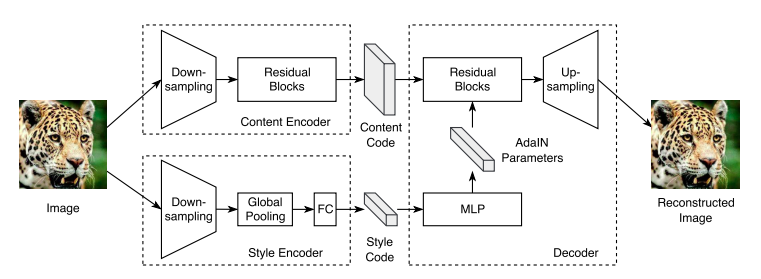

Кроме того авторы добавили новые лоссы для эффективного обучения модели:
* $\mathcal{L}_{recon}^{x}\left(\mathcal{E}_1, \mathcal{G}_1\right) = \mathsf{E}\left\|G\left(\mathcal{E}_1^c\left(X\right),\mathcal{E}_1^s\left(X\right)\right)-X_1\right\|_1$ &mdash; лосс реконструкции изображения.
* $\mathcal{L}_{recon}^{x}\left(\mathcal{E}_2, \mathcal{G}_2\right)=\mathsf{E}\left\|G\left(\mathcal{E}_2^c\left(X\right),\mathcal{E}_2^s\left(X\right)\right)-X_2\right\|_1$ &mdash; лосс реконструкции изображения.
*
* $\mathcal{L}_{recon}^{c}\left(\mathcal{E}_1, \mathcal{E}_2, \mathcal{G}_2\right) = \mathsf{E}\left\|\mathcal{E}_2^c\left(\mathcal{G}_2\left(C_1, S_2\right)\right) - C_1\right\|_1$ &mdash; лосс реконстукции латентного вектора контента, где $C_1=\mathcal{E}_1^c\left(X_1\right)$.
* $\mathcal{L}_{recon}^{c}\left(\mathcal{E}_2, \mathcal{E}_1, \mathcal{G}_1\right) = \mathsf{E}\left\|\mathcal{E}_1^c\left(\mathcal{G}_1\left(C_2, S_1\right)\right) - C_2\right\|_1$ &mdash; лосс реконстукции латентного вектора контента, где $C_2=\mathcal{E}_2^c\left(X_2\right)$.
*
* $\mathcal{L}_{recon}^{s}\left(\mathcal{E}_1, \mathcal{E}_2, \mathcal{G}_2\right)=\mathsf{E}\left\|\mathcal{E}_2^c\left(\mathcal{G}_2\left(C_1, S_2\right)\right) - S_2\right\|_1$ &mdash; лосс реконстукции латентного вектора стиля, где $C_1=\mathcal{E}_1^c\left(X_1\right)$.
* $\mathcal{L}_{recon}^{s}\left(\mathcal{E}_2, \mathcal{E}_1, \mathcal{G}_1\right)=\mathsf{E}\left\|\mathcal{E}_1^c\left(\mathcal{G}_1\left(C_2, S_1\right)\right) - S_1\right\|_1$ &mdash; лосс реконстукции латентного вектора стиля, где $C_2=\mathcal{E}_2^c\left(X_2\right)$.
*
* $\mathcal{L}_{GAN}^{x}\left(\mathcal{E}_1, \mathcal{G}_2, \mathcal{D}_2\right) = \mathsf{E}\log\left(1-\mathcal{D}_2\left(\mathcal{G}_2\left(C_1, S_2\right)\right)\right) + \mathsf{E}\log\mathcal{D}_2\left(X_2\right)$ &mdash; адверсальный лосс, где $C_1=\mathcal{E}_1^c\left(X_1\right)$.
* $\mathcal{L}_{GAN}^{x}\left(\mathcal{E}_2, \mathcal{G}_1, \mathcal{D}_1\right) = \mathsf{E}\log\left(1-\mathcal{D}_1\left(\mathcal{G}_1\left(C_2, S_1\right)\right)\right) + \mathsf{E}\log\mathcal{D}_1\left(X_1\right)$ &mdash; адверсальный лосс, где $C_2=\mathcal{E}_2^c\left(X_2\right)$.

где
* $X_1, X_2$ &mdash; независимые случайные изображения из истинного распределения первого и второго доменов изображений соответственно.
* $S_1$, $S_2$ &mdash; вектора стиля, которые задаются как случайные вектора из $\mathcal{N}\left(\vec{0};\, I\right)$.

Задача оптимизации представляется как

$$\min_{\mathcal{E}_1,\mathcal{E}_2,\mathcal{G}_1,\mathcal{G}_2}\:\max_{\mathcal{D}_1, \mathcal{D}_2}\:\mathcal{L}(\mathcal{E}_1, \mathcal{E}_2, \mathcal{G}_1, \mathcal{G}_2, \mathcal{D}_1, \mathcal{D}_2) = $$
$$ = \mathcal{L}_{GAN}^{x}\left(\mathcal{E}_1, \mathcal{G}_2, \mathcal{D}_2\right) + \mathcal{L}_{GAN}^{x}\left(\mathcal{E}_2, \mathcal{G}_1, \mathcal{D}_1\right) + $$
$$ + \lambda_x\left(\mathcal{L}_{recon}^{x}\left(\mathcal{E}_1, \mathcal{G}_1\right) + \mathcal{L}_{recon}^{x}\left(\mathcal{E}_2, \mathcal{G}_2\right)\right) + $$
$$ + \lambda_c\left(\mathcal{L}_{recon}^{c}\left(\mathcal{E}_1, \mathcal{E}_2, \mathcal{G}_2\right) + \mathcal{L}_{recon}^{c}\left(\mathcal{E}_2, \mathcal{E}_1, \mathcal{G}_1\right)\right) + $$
$$ + \lambda_s\left(\mathcal{L}_{recon}^{s}\left(\mathcal{E}_1, \mathcal{E}_2, \mathcal{G}_2\right) + \mathcal{L}_{recon}^{s}\left(\mathcal{E}_2, \mathcal{E}_1, \mathcal{G}_1\right)\right)$$

Ниже представлена схема для используемых в модели лоссов.

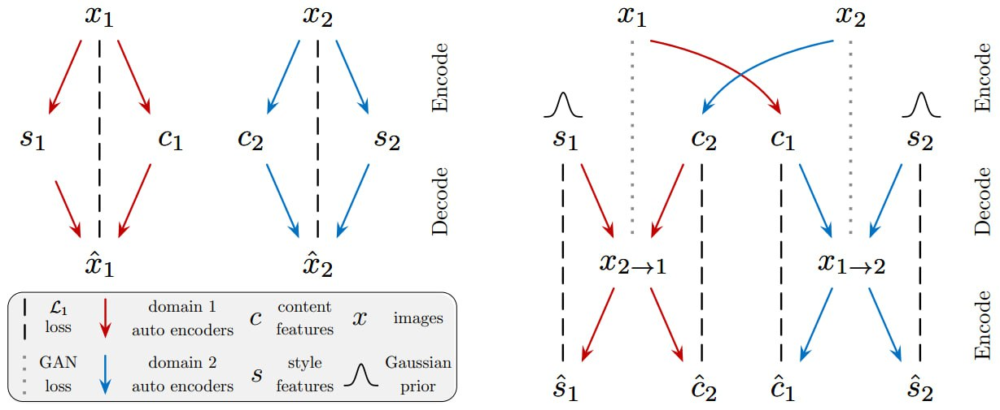

Вам предстоит провести несколько экспериментов по переходу от CycleGAN к MUNIT и оценить эффективность различных модификаций. Для того, чтобы ускорить часть с написанием кода, вы можете ориентироваться на [данную реализацию](https://github.com/eriklindernoren/PyTorch-GAN/tree/master/implementations/munit) модели MUNIT. Как и в прошлом ДЗ трансфер стиля будет осуществляться между датасетами <a href="https://www.kaggle.com/datasets/soumikrakshit/anime-faces">Anime Faces</a>
и <a href="https://www.kaggle.com/datasets/spandan2/cats-faces-64x64-for-generative-models">Cats faces</a>.


Для реализации CycleGAN буду использовать хорошую [статью](https://medium.com/@chilldenaya/cyclegan-introduction-pytorch-implementation-5b53913741ca) с сайта Medium. 

**1.** Реализуйте архитектуру генератора и дискриминатора для CycleGAN. Для того, чтобы оценить качественный переход от CycleGAN к MUNIT, предлагаем сначала найти оптимальную архитектуру для генератора и дискриминатора в CycleGAN такую, то генератор должен будет состоять из блоков энкодера контекста $\mathcal{E}^c$ и декодера $\mathcal{G}$. Затем для реализации MUNIT нужно будет добавить блок энкодера стиля $\mathcal{E}^s$ и сделать необходимые пробросы стиля в декодер $\mathcal{G}$.

In [3]:
class ConvolutionalBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        is_downsampling: bool = True,
        add_activation: bool = True,
        **kwargs
    ):
        super().__init__()
        if is_downsampling:
            self.conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )

    def forward(self, x):
        return self.conv(x)
    
class ResidualBlock(nn.Module):
    def __init__(self, channels: int):
        super().__init__()
        self.block = nn.Sequential(
            ConvolutionalBlock(channels, channels, add_activation=True, kernel_size=3, padding=1),
            ConvolutionalBlock(channels, channels, add_activation=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(
        self, img_channels: int, num_features: int = 64, num_residuals: int = 6
    ):
        """
        Generator consists of 2 layers of downsampling/encoding layer, 
        followed by 6 residual blocks for 128 × 128 training images 
        and then 3 upsampling/decoding layer. 
        
        The network with 6 residual blocks can be written as: 
        c7s1–64, d128, d256, R256, R256, R256, R256, R256, R256, u128, u64, and c7s1–3.
        """
        super().__init__()
        self.initial_layer = nn.Sequential(
            nn.Conv2d(
                img_channels,
                num_features,
                kernel_size=7,
                stride=1,
                padding=3,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )

        self.downsampling_layers = nn.ModuleList(
            [
                ConvolutionalBlock(
                    num_features, 
                    num_features * 2,
                    is_downsampling=True, 
                    kernel_size=3, 
                    stride=2, 
                    padding=1,
                ),
                ConvolutionalBlock(
                    num_features * 2,
                    num_features * 4,
                    is_downsampling=True,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                ),
            ]
        )

        self.residual_layers = nn.Sequential(
            *[ResidualBlock(num_features * 4) for _ in range(num_residuals)]
        )

        self.upsampling_layers = nn.ModuleList(
            [
                ConvolutionalBlock(
                    num_features * 4,
                    num_features * 2,
                    is_downsampling=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
                ConvolutionalBlock(
                    num_features * 2,
                    num_features * 1,
                    is_downsampling=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
            ]
        )

        self.last_layer = nn.Conv2d(
            num_features * 1,
            img_channels,
            kernel_size=7,
            stride=1,
            padding=3,
            padding_mode="reflect",
        )

    def forward(self, x):
        x = self.initial_layer(x)
        for layer in self.downsampling_layers:
            x = layer(x)
        x = self.residual_layers(x)
        for layer in self.upsampling_layers:
            x = layer(x)
        return torch.tanh(self.last_layer(x))

class ConvInstanceNormLeakyReLUBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, stride: int):
        """
        Class object initialization for Convolution-InstanceNorm-LeakyReLU layer

        We use leaky ReLUs with a slope of 0.2.
        """
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=4,
                stride=stride,
                padding=1,
                bias=True,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial_layer = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                ConvInstanceNormLeakyReLUBlock(
                    in_channels, 
                    feature, 
                    stride=1 if feature == features[-1] else 2,
                )
            )
            in_channels = feature
 
        layers.append(
            nn.Conv2d(
                in_channels,
                1,
                kernel_size=4,
                stride=1,
                padding=1,
                padding_mode="reflect",
            )
        )
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial_layer(x)
        return self.model(x)

In [4]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        in_channels: int = 3,
        num_features: int = 64,
        num_residuals: int = 6,
        lambda_identity: float = 0.5,
        lambda_cycle: float = 10,
    ):
        super().__init__()
        self.lambda_identity = lambda_identity
        self.lambda_cycle = lambda_cycle
        
        # Generators
        self.gen_A_to_B = Generator(in_channels, num_features, num_residuals)
        self.gen_B_to_A = Generator(in_channels, num_features, num_residuals)
        
        # Discriminators
        self.disc_A = Discriminator(in_channels)
        self.disc_B = Discriminator(in_channels)
        
    def forward(self, x_A, x_B):
        # Generate images
        fake_B = self.gen_A_to_B(x_A)
        fake_A = self.gen_B_to_A(x_B)
        
        # Reconstruct images
        recon_A = self.gen_B_to_A(fake_B)
        recon_B = self.gen_A_to_B(fake_A)
        
        # Identity mapping
        identity_A = self.gen_B_to_A(x_A)
        identity_B = self.gen_A_to_B(x_B)
        
        return fake_A, fake_B, recon_A, recon_B, identity_A, identity_B
    
    def translate_A_to_B(self, x_A):
        """Перевод из домена A в домен B"""
        with torch.no_grad():
            self.eval()
            fake_B = self.gen_A_to_B(x_A)
            self.train()
            return fake_B
    
    def translate_B_to_A(self, x_B):
        """Перевод из домена B в домен A"""
        with torch.no_grad():
            self.eval()
            fake_A = self.gen_B_to_A(x_B)
            self.train()
            return fake_A
    
    def sample(self, x_A, x_B, num_samples=4):
        """Сэмплирование переводов для визуализации"""
        with torch.no_grad():
            self.eval()
            
            # Ограничиваем количество сэмплов
            x_A_sample = x_A[:num_samples]
            x_B_sample = x_B[:num_samples]
            
            # Переводы
            fake_B = self.gen_A_to_B(x_A_sample)
            fake_A = self.gen_B_to_A(x_B_sample)
            
            # Реконструкции
            recon_A = self.gen_B_to_A(fake_B)
            recon_B = self.gen_A_to_B(fake_A)
            
            # Identity
            identity_A = self.gen_B_to_A(x_A_sample)
            identity_B = self.gen_A_to_B(x_B_sample)
            
            self.train()
            
            return {
                'real_A': x_A_sample,
                'real_B': x_B_sample,
                'fake_B': fake_B,
                'fake_A': fake_A,
                'recon_A': recon_A,
                'recon_B': recon_B,
                'identity_A': identity_A,
                'identity_B': identity_B
            }
    
    def get_translation_pair(self, x_A, x_B):
        """Получение одной пары переводов для быстрой визуализации"""
        with torch.no_grad():
            self.eval()
            
            # Берем по одному изображению
            if x_A.size(0) > 1:
                x_A = x_A[:1]
            if x_B.size(0) > 1:
                x_B = x_B[:1]
            
            fake_B = self.gen_A_to_B(x_A)
            fake_A = self.gen_B_to_A(x_B)
            
            self.train()
            
            return x_A, fake_B, x_B, fake_A


In [5]:
def plot_cycle_gan_losses(losses_history):
    """Рисует все лоссы и закрывает фигуру после показа"""
    clear_output(wait=True)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    axes = axes.flatten()
    loss_names = ["D_A_loss", "D_B_loss", "G_loss"]
    titles = ["Discriminator A", "Discriminator B", "Generator"]
    
    for i, (name, title) in enumerate(zip(loss_names, titles)):
        if len(losses_history[name]) > 0:
            axes[i].plot(losses_history[name], linewidth=1.2)
            axes[i].set_title(title)
            axes[i].set_xlabel("Iterations")
            axes[i].set_ylabel("Loss")
            axes[i].grid(True, linestyle='--', alpha=0.6)
        else:
            # Если данных нет, рисуем пустой график для отладки
            axes[i].set_title(f"{title} (No data)")
            axes[i].set_xlabel("Iterations")
            axes[i].set_ylabel("Loss")
            axes[i].grid(True, linestyle='--', alpha=0.6)
    
    # axes[2].set_visible(False)
    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Явно закрываем фигуру

def visualize_cycle_gan_results(cycle_gan, real_A, real_B, device):
    """Визуализирует перевод изображений и закрывает фигуру"""
    # Отключаем градиенты правильно
    with torch.no_grad():
        cycle_gan.eval()  # Убедимся, что модель в eval режиме
        
        real_A = real_A.to(device)
        real_B = real_B.to(device)
        
        fake_B = cycle_gan.gen_A_to_B(real_A)
        fake_A = cycle_gan.gen_B_to_A(real_B)
        recon_A = cycle_gan.gen_B_to_A(fake_B)
        recon_B = cycle_gan.gen_A_to_B(fake_A)
        
        def denormalize(tensor):
            return (tensor + 1) / 2
        
        grids = [
            denormalize(real_A[:4]),
            denormalize(fake_B[:4]),
            denormalize(recon_A[:4]),
            denormalize(real_B[:4]),
            denormalize(fake_A[:4]),
            denormalize(recon_B[:4]),
        ]
        titles = ['Real A', 'A → B', 'Reconstructed A',
                  'Real B', 'B → A', 'Reconstructed B']
        
        plt.ioff()  # Выключаем интерактивный режим
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        for i, (grid, title) in enumerate(zip(grids, titles)):
            img = torchvision.utils.make_grid(grid, nrow=2, padding=2, normalize=False)
            axes[i].imshow(img.permute(1, 2, 0).cpu().numpy())
            axes[i].set_title(title)
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()
        plt.close(fig)  # Явно закрываем фигуру

    cycle_gan.train()  # Возвращаем модель в train режим

In [6]:
class LambdaLR:
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_start_epoch) / (self.n_epochs - self.decay_start_epoch)

class CycleGANTrainer:
    def __init__(
        self,
        cycle_gan: CycleGAN,
        lr: float = 2e-4,
        beta1: float = 0.5,
        beta2: float = 0.999,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        lambda_identity: float = 0.5,
        lambda_cycle: float = 10,
        num_epochs: int = 200,  # Добавляем параметр количества эпох
    ):
        self.cycle_gan = cycle_gan.to(device)
        self.device = device
        self.device_type = "cuda" if torch.cuda.is_available() else "cpu"
        self.lambda_identity = lambda_identity
        self.lambda_cycle = lambda_cycle
        self.initial_lr = lr
        
        # Optimizers
        self.opt_gen = optim.Adam(
            list(cycle_gan.gen_A_to_B.parameters()) + list(cycle_gan.gen_B_to_A.parameters()),
            lr=lr,
            betas=(beta1, beta2),
        )
        self.opt_disc_A = optim.Adam(cycle_gan.disc_A.parameters(), lr=lr, betas=(beta1, beta2))
        self.opt_disc_B = optim.Adam(cycle_gan.disc_B.parameters(), lr=lr, betas=(beta1, beta2))
        
        # Learning rate schedulers
        decay_start_epoch = num_epochs // 2
        self.lr_scheduler_gen = LambdaLR(num_epochs, 0, decay_start_epoch)
        self.lr_scheduler_disc_A = LambdaLR(num_epochs, 0, decay_start_epoch)
        self.lr_scheduler_disc_B = LambdaLR(num_epochs, 0, decay_start_epoch)
        
        # Losses
        self.mse = nn.MSELoss()
        self.l1 = nn.L1Loss()
        
        # Mixed precision
        self.scaler_gen = GradScaler()
        self.scaler_disc_A = GradScaler()
        self.scaler_disc_B = GradScaler()
        
        # Loss history
        self.losses_history = {
            "D_A_loss": [],
            "D_B_loss": [],
            "G_loss": [],
        }

    def train_step(self, real_A, real_B):
        real_A = real_A.to(self.device)
        real_B = real_B.to(self.device)
        
        # Discriminator A
        with autocast(device_type=self.device_type):
            fake_A = self.cycle_gan.gen_B_to_A(real_B)
            D_A_real = self.cycle_gan.disc_A(real_A)
            D_A_fake = self.cycle_gan.disc_A(fake_A.detach())
            D_A_loss = (self.mse(D_A_real, torch.ones_like(D_A_real)) + 
                        self.mse(D_A_fake, torch.zeros_like(D_A_fake))) / 2
        self.opt_disc_A.zero_grad()
        self.scaler_disc_A.scale(D_A_loss).backward()
        self.scaler_disc_A.step(self.opt_disc_A)
        self.scaler_disc_A.update()
        
        # Discriminator B
        with autocast(device_type=self.device_type):
            fake_B = self.cycle_gan.gen_A_to_B(real_A)
            D_B_real = self.cycle_gan.disc_B(real_B)
            D_B_fake = self.cycle_gan.disc_B(fake_B.detach())
            D_B_loss = (self.mse(D_B_real, torch.ones_like(D_B_real)) + 
                        self.mse(D_B_fake, torch.zeros_like(D_B_fake))) / 2
        self.opt_disc_B.zero_grad()
        self.scaler_disc_B.scale(D_B_loss).backward()
        self.scaler_disc_B.step(self.opt_disc_B)
        self.scaler_disc_B.update()
        
        # Generator
        with autocast(device_type=self.device_type):
            D_A_fake = self.cycle_gan.disc_A(fake_A)
            D_B_fake = self.cycle_gan.disc_B(fake_B)
            loss_G = self.mse(D_A_fake, torch.ones_like(D_A_fake)) + self.mse(D_B_fake, torch.ones_like(D_B_fake))
            
            cycle_A = self.cycle_gan.gen_B_to_A(fake_B)
            cycle_B = self.cycle_gan.gen_A_to_B(fake_A)
            cycle_loss = (self.l1(cycle_A, real_A) + self.l1(cycle_B, real_B)) * self.lambda_cycle
            
            identity_A = self.cycle_gan.gen_B_to_A(real_A)
            identity_B = self.cycle_gan.gen_A_to_B(real_B)
            identity_loss = (self.l1(identity_A, real_A) + self.l1(identity_B, real_B)) * self.lambda_identity
            
            G_loss = loss_G + cycle_loss + identity_loss
        
        self.opt_gen.zero_grad()
        self.scaler_gen.scale(G_loss).backward()
        self.scaler_gen.step(self.opt_gen)
        self.scaler_gen.update()
        
        return {
            "D_A_loss": D_A_loss.item(),
            "D_B_loss": D_B_loss.item(),
            "G_loss": G_loss.item(),
        }

    def update_learning_rate(self, epoch):
        lr_multiplier = self.lr_scheduler_gen.step(epoch)
        
        for param_group in self.opt_gen.param_groups:
            param_group['lr'] = self.initial_lr * lr_multiplier
        for param_group in self.opt_disc_A.param_groups:
            param_group['lr'] = self.initial_lr * lr_multiplier
        for param_group in self.opt_disc_B.param_groups:
            param_group['lr'] = self.initial_lr * lr_multiplier

    def train(self, 
              train_loader_A, 
              train_loader_B, 
              val_loader_A, 
              val_loader_B,
              num_iterations: int = 10000,
              visualize_interval: int = 500):
        
        # Get one fixed validation batch
        val_real_A = next(iter(val_loader_A))
        val_real_B = next(iter(val_loader_B))
        if isinstance(val_real_A, (list, tuple)):
            val_real_A = val_real_A[0]
        if isinstance(val_real_B, (list, tuple)):
            val_real_B = val_real_B[0]

        train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)

        for iteration in tqdm(range(num_iterations)):
            epoch = iteration // max(len(train_loader_A), len(train_loader_B))
            
            self.update_learning_rate(epoch)
            
            try:
                real_A = next(train_iter_A)
                real_B = next(train_iter_B)
            except StopIteration:
                train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)
                real_A = next(train_iter_A)
                real_B = next(train_iter_B)
            
            if isinstance(real_A, (list, tuple)):
                real_A = real_A[0]
            if isinstance(real_B, (list, tuple)):
                real_B = real_B[0]

            losses = self.train_step(real_A, real_B)
            for k, v in losses.items():
                self.losses_history[k].append(v)

            if (iteration + 1) % visualize_interval == 0:
                plot_cycle_gan_losses(self.losses_history)
                visualize_cycle_gan_results(self.cycle_gan, val_real_A, val_real_B, self.device)

        print("Training completed!")

    def save_models(self, path_prefix="cycle_gan"):
        torch.save(self.cycle_gan.gen_A_to_B.state_dict(), f"{path_prefix}_gen_A_to_B.pth")
        torch.save(self.cycle_gan.gen_B_to_A.state_dict(), f"{path_prefix}_gen_B_to_A.pth")
        torch.save(self.cycle_gan.disc_A.state_dict(), f"{path_prefix}_disc_A.pth")
        torch.save(self.cycle_gan.disc_B.state_dict(), f"{path_prefix}_disc_B.pth")
        
    def load_models(self, path_prefix="cycle_gan"):
        self.cycle_gan.gen_A_to_B.load_state_dict(torch.load(f"{path_prefix}_gen_A_to_B.pth"))
        self.cycle_gan.gen_B_to_A.load_state_dict(torch.load(f"{path_prefix}_gen_B_to_A.pth"))
        self.cycle_gan.disc_A.load_state_dict(torch.load(f"{path_prefix}_disc_A.pth"))
        self.cycle_gan.disc_B.load_state_dict(torch.load(f"{path_prefix}_disc_B.pth"))

**2.** Выпишите задачу оптимизации CycleGAN, учитывая нотацию представленную в этом задании.

Нотация в задании не особо подходит для описания лосса CycleGAN, так как архитектура MUNIT имеет немного другую архитектуру.

Так что я поясню, пусть мы имее два пространства распределений X и Y, стили между которыми хотим научиться переносить. Пусть G: X -> Y, F: Y -> X -- генераторы из одного распределения в другое. Пусть $D_{X}$ и $D_{Y}$ -- дискриминаторы для X и Y соответственно.

Тогда лосс имеет вид:

$$
L(G, F, D_{X}, D_{Y}) = L_{GAN}(G, D_{Y}, X, Y) + L_{GAN}(F, D_{X}, Y, X) + \lambda L_{cyc}(G, F) 
$$

**3.** Обучите CycleGAN на изображениях аниме и котов. Найдите оптимальные параметры обучения, в том числе коэффициент при $\mathcal{L}_{cyc}$. В процессе обучения визуализируйте лоссы генератора, дискриминатора, а также результаты генерации из аниме в кошку, из кошки в аниме и результаты восстановления изображений, таким образом получится четыре набора изображений.

In [12]:
NUM_ITER = 8001

In [13]:
def setup_data_loaders(batch_size=4, use_cuda=False, path="./data", max_size=None):
    trans = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
    ])
    
    full_dataset = datasets.ImageFolder(root=path, transform=trans)

    if max_size is not None and max_size < len(full_dataset):
        full_dataset, _ = random_split(full_dataset, [max_size, len(full_dataset) - max_size])

    train_size = int(0.8 * len(full_dataset))
    test_size = len(full_dataset) - train_size
    generator = torch.Generator().manual_seed(42)
    train_set, test_set = random_split(full_dataset, [train_size, test_size], generator=generator)

    kwargs = {'num_workers': 16, 'pin_memory': use_cuda, 'prefetch_factor': 2}

    train_loader = DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True, **kwargs)
    test_loader = DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False, **kwargs)

    return train_loader, test_loader

In [14]:
anime_train_loader, anime_val_loader = setup_data_loaders(4, use_cuda=USE_CUDA, path="anime")
cats_train_loader, cats_val_loader = setup_data_loaders(4, use_cuda=USE_CUDA, path='cats')

In [15]:
cycle_gan = CycleGAN(in_channels=3, num_features=64, num_residuals=6)
cycle_trainer = CycleGANTrainer(cycle_gan, lr=2e-4, device=device)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

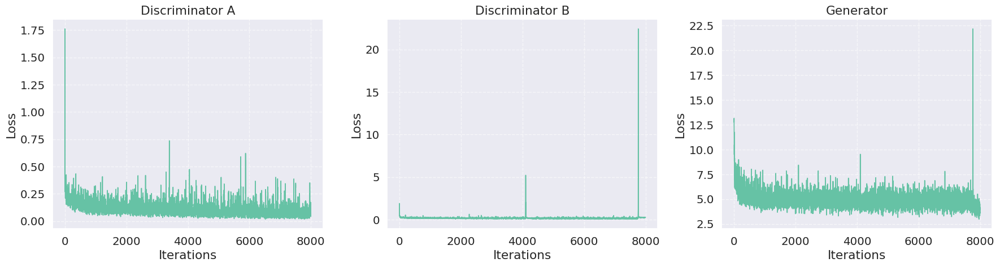

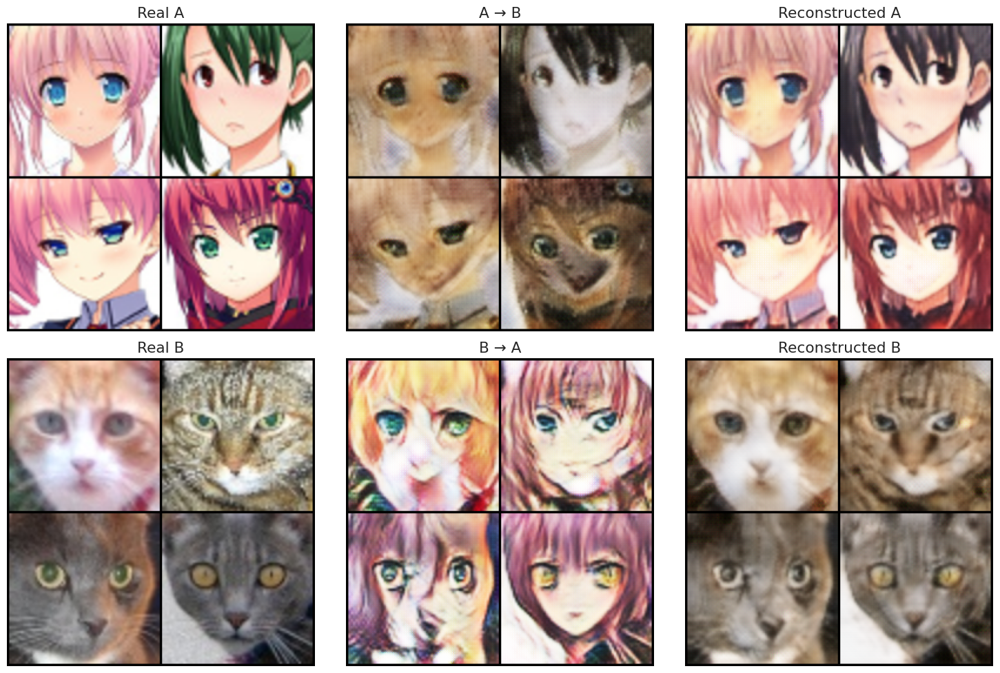

Training completed!


In [16]:
cycle_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,
    visualize_interval=visualize_interval
)

Теперь реализуем MUNIT

In [17]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)


class LambdaLR:
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert (
            n_epochs - decay_start_epoch
        ) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_start_epoch) / (
            self.n_epochs - self.decay_start_epoch
        )


#################################
#           Encoder
#################################


class Encoder(nn.Module):
    def __init__(
        self, in_channels=3, dim=64, n_residual=3, n_downsample=2, style_dim=8
    ):
        super(Encoder, self).__init__()
        self.content_encoder = ContentEncoder(
            in_channels, dim, n_residual, n_downsample
        )
        self.style_encoder = StyleEncoder(in_channels, dim, n_downsample, style_dim)

    def forward(self, x):
        content_code = self.content_encoder(x)
        style_code = self.style_encoder(x)
        return content_code, style_code


#################################
#            Decoder
#################################
class Decoder(nn.Module):
    def __init__(self, out_channels=3, dim=64, n_residual=3, n_upsample=2, style_dim=8):
        super(Decoder, self).__init__()

        layers = []
        dim = dim * 2 ** n_upsample
        # Residual blocks
        for _ in range(n_residual):
            layers += [ResidualBlock(dim, norm="adain")]

        # Upsampling
        for _ in range(n_upsample):
            layers += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(dim, dim // 2, 5, stride=1, padding=2),
                LayerNorm(dim // 2),
                nn.ReLU(inplace=True),
            ]
            dim = dim // 2

        # Output layer
        layers += [nn.ReflectionPad2d(3), nn.Conv2d(dim, out_channels, 7), nn.Tanh()]

        self.model = nn.Sequential(*layers)

        # Initiate mlp (predicts AdaIN parameters)
        num_adain_params = self.get_num_adain_params()
        self.mlp = MLP(style_dim, num_adain_params)

    def get_num_adain_params(self):
        """Return the number of AdaIN parameters needed by the model"""
        num_adain_params = 0
        for m in self.modules():
            if m.__class__.__name__ == "AdaptiveInstanceNorm2d":
                num_adain_params += 2 * m.num_features
        return num_adain_params

    def assign_adain_params(self, adain_params):
        """Assign the adain_params to the AdaIN layers in model"""
        for m in self.modules():
            if m.__class__.__name__ == "AdaptiveInstanceNorm2d":
                # Extract mean and std predictions
                mean = adain_params[:, : m.num_features]
                std = adain_params[:, m.num_features : 2 * m.num_features]
                # Update bias and weight
                m.bias = mean.contiguous().view(-1)
                m.weight = std.contiguous().view(-1)
                # Move pointer
                if adain_params.size(1) > 2 * m.num_features:
                    adain_params = adain_params[:, 2 * m.num_features :]

    def forward(self, content_code, style_code):
        # Update AdaIN parameters by MLP prediction based off style code
        batch_size = min(content_code.size(0), style_code.size(0))
        content_code = content_code[:batch_size]
        style_code = style_code[:batch_size]
        self.assign_adain_params(self.mlp(style_code))
        img = self.model(content_code)
        return img


#################################
#        Content Encoder
#################################


class ContentEncoder(nn.Module):
    def __init__(self, in_channels=3, dim=64, n_residual=3, n_downsample=2):
        super(ContentEncoder, self).__init__()

        # Initial convolution block
        layers = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, dim, 7),
            nn.InstanceNorm2d(dim),
            nn.ReLU(inplace=True),
        ]

        # Downsampling
        for _ in range(n_downsample):
            layers += [
                nn.Conv2d(dim, dim * 2, 4, stride=2, padding=1),
                nn.InstanceNorm2d(dim * 2),
                nn.ReLU(inplace=True),
            ]
            dim *= 2

        # Residual blocks
        for _ in range(n_residual):
            layers += [ResidualBlock(dim, norm="in")]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


#################################
#        Style Encoder
#################################

class StyleEncoder(nn.Module):
    def __init__(self, in_channels=3, dim=64, n_downsample=2, style_dim=8):
        super(StyleEncoder, self).__init__()

        # Initial conv block
        layers = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, dim, 7),
            nn.ReLU(inplace=True),
        ]

        # Downsampling
        for _ in range(2):
            layers += [
                nn.Conv2d(dim, dim * 2, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
            ]
            dim *= 2

        # Downsampling with constant depth
        for _ in range(n_downsample - 2):
            layers += [
                nn.Conv2d(dim, dim, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
            ]

        # Average pool and output layer
        layers += [nn.AdaptiveAvgPool2d(1), nn.Conv2d(dim, style_dim, 1, 1, 0)]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x).view(x.size(0), -1)



######################################
#   MLP (predicts AdaIn parameters)
######################################


class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, dim=256, n_blk=3, activ="relu"):
        super(MLP, self).__init__()
        layers = [nn.Linear(input_dim, dim), nn.ReLU(inplace=True)]
        for _ in range(n_blk - 2):
            layers += [nn.Linear(dim, dim), nn.ReLU(inplace=True)]
        layers += [nn.Linear(dim, output_dim)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        # Ensure input is properly flattened
        if x.dim() > 2:
            x = x.view(x.size(0), -1)
        return self.model(x)



##############################
#        Discriminator
##############################


class SimpleDiscriminator(nn.Module):
    def __init__(self, in_channels=3, ndf=64):
        super(SimpleDiscriminator, self).__init__()
        
        self.main = nn.Sequential(
            # 64 x 64 -> 32 x 32
            nn.Conv2d(in_channels, ndf, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            # 32 x 32 -> 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1),
            nn.InstanceNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # 16 x 16 -> 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1),
            nn.InstanceNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # 8 x 8 -> 4 x 4
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1),
            nn.InstanceNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # 4 x 4 -> 1 x 1
            nn.Conv2d(ndf * 8, 1, 4, 1, 0),
        )

    def forward(self, input):
        return self.main(input)

class MultiDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(MultiDiscriminator, self).__init__()
        self.disc = SimpleDiscriminator(in_channels)

    def forward(self, x):
        return [self.disc(x)]

    def compute_loss(self, x, target):
        outputs = self.forward(x)
        loss = 0
        for out in outputs:
            if target == 1:  # real
                target_tensor = torch.ones_like(out)
            else:  # fake
                target_tensor = torch.zeros_like(out)
            loss += F.binary_cross_entropy_with_logits(out, target_tensor)
        return loss / len(outputs)

##############################
#       Custom Blocks
##############################


class ResidualBlock(nn.Module):
    def __init__(self, features, norm="in"):
        super(ResidualBlock, self).__init__()

        norm_layer = AdaptiveInstanceNorm2d if norm == "adain" else nn.InstanceNorm2d

        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(features, features, 3),
            norm_layer(features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(features, features, 3),
            norm_layer(features),
        )

    def forward(self, x):
        return x + self.block(x)


##############################
#        Custom Layers
##############################


class AdaptiveInstanceNorm2d(nn.Module):
    """Reference: https://github.com/NVlabs/MUNIT/blob/master/networks.py"""

    def __init__(self, num_features, eps=1e-5, momentum=0.1):
        super(AdaptiveInstanceNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        # weight and bias are dynamically assigned
        self.weight = None
        self.bias = None
        # just dummy buffers, not used
        self.register_buffer("running_mean", torch.zeros(num_features))
        self.register_buffer("running_var", torch.ones(num_features))

    def forward(self, x):
        assert (
            self.weight is not None and self.bias is not None
        ), "Please assign weight and bias before calling AdaIN!"
        b, c, h, w = x.size()

        running_mean = self.running_mean.repeat(b)
        running_var = self.running_var.repeat(b)

        if running_mean.dtype != x.dtype:
            running_mean = running_mean.to(x.dtype)
            running_var = running_var.to(x.dtype)
        if self.weight.dtype != x.dtype:
            weight = self.weight.to(x.dtype)
            bias = self.bias.to(x.dtype)
        else:
            weight, bias = self.weight, self.bias

        x_reshaped = x.contiguous().view(1, b * c, h, w)
        out = F.batch_norm(
            x_reshaped, running_mean, running_var, weight, bias, True, self.momentum, self.eps
        )
        return out.view(b, c, h, w)

    def __repr__(self):
        return self.__class__.__name__ + "(" + str(self.num_features) + ")"


class LayerNorm(nn.Module):
    def __init__(self, num_features, eps=1e-5, affine=True):
        super(LayerNorm, self).__init__()
        self.num_features = num_features
        self.affine = affine
        self.eps = eps

        if self.affine:
            self.gamma = nn.Parameter(torch.Tensor(num_features).uniform_())
            self.beta = nn.Parameter(torch.zeros(num_features))

    def forward(self, x):
        shape = [-1] + [1] * (x.dim() - 1)
        mean = x.view(x.size(0), -1).mean(1).view(*shape)
        std = x.view(x.size(0), -1).std(1).view(*shape)
        x = (x - mean) / (std + self.eps)

        if self.affine:
            shape = [1, -1] + [1] * (x.dim() - 2)
            x = x * self.gamma.view(*shape) + self.beta.view(*shape)
        return x

In [18]:
class MUNIT(nn.Module):
    def __init__(
        self,
        in_channels: int = 3,
        num_features: int = 64,
        num_residuals: int = 4,
        style_dim: int = 64,
        device="cuda",
    ):
        super(MUNIT, self).__init__()
        self.device = device
        self.style_dim = style_dim

        # Используем n_downsample=2 вместо 3 для 64x64 изображений
        self.encoder_A = Encoder(in_channels, num_features, n_residual=num_residuals, n_downsample=2, style_dim=style_dim)
        self.encoder_B = Encoder(in_channels, num_features, n_residual=num_residuals, n_downsample=2, style_dim=style_dim)

        self.dec_A = Decoder(out_channels=in_channels, dim=num_features, 
                            n_residual=num_residuals, n_upsample=2, style_dim=style_dim)
        self.dec_B = Decoder(out_channels=in_channels, dim=num_features,
                            n_residual=num_residuals, n_upsample=2, style_dim=style_dim)

        
        self.disc_A = MultiDiscriminator(in_channels)
        self.disc_B = MultiDiscriminator(in_channels)

        self.apply(weights_init_normal)

    def forward(self, x_A, x_B):
        content_A, style_A = self.encoder_A(x_A)
        content_B, style_B = self.encoder_B(x_B)

        fake_A = self.dec_A(content_B, style_A)
        fake_B = self.dec_B(content_A, style_B)

        recon_A = self.dec_A(content_A, style_A)
        recon_B = self.dec_B(content_B, style_B)

        return fake_A, fake_B, recon_A, recon_B
    
    def sample(self, x_A, x_B, num_samples=4):
        """Генерация изображений с различными стилями для визуализации"""
        with torch.no_grad():
            self.eval()

            # Берем ограниченное количество примеров для быстрого визуала
            x_A_sample = x_A[:num_samples].to(self.device)
            x_B_sample = x_B[:num_samples].to(self.device)

            # === Кодировка контента и стиля ===
            content_A, _ = self.encoder_A(x_A_sample)
            content_B, _ = self.encoder_B(x_B_sample)

            # === Переводы в противоположные домены со случайным стилем ===
            style_A_rand = torch.randn(num_samples, self.style_dim, device=self.device)
            style_B_rand = torch.randn(num_samples, self.style_dim, device=self.device)

            fake_B = self.dec_B(content_A, style_B_rand)  # A → B (Styled)
            fake_A = self.dec_A(content_B, style_A_rand)  # B → A (Styled)

            # === Реконструкции контента (cycle‑reconstruction) ===
            content_fake_B, _ = self.encoder_B(fake_B)
            content_fake_A, _ = self.encoder_A(fake_A)
            recon_A = self.dec_A(content_fake_B, style_A_rand)
            recon_B = self.dec_B(content_fake_A, style_B_rand)

            # === Identity mapping (A→A, B→B через собственные декодеры) ===
            _, style_A_self = self.encoder_A(x_A_sample)
            _, style_B_self = self.encoder_B(x_B_sample)
            identity_A = self.dec_A(content_A, style_A_self)
            identity_B = self.dec_B(content_B, style_B_self)

            self.train()

            return {
                "real_A": x_A_sample,
                "real_B": x_B_sample,
                "fake_B": fake_B,          # A → B styled
                "fake_A": fake_A,          # B → A styled
                "recon_A": recon_A,        # cycle‑reconstructed A
                "recon_B": recon_B,        # cycle‑reconstructed B
                "identity_A": identity_A,  # A → A
                "identity_B": identity_B   # B → B
            }

    def translate_A_to_B(self, x_A, style_B=None):
        """Перевод из домена A в B"""
        content_A, _ = self.encoder_A(x_A)
        if style_B is None:
            style_B = torch.randn(x_A.size(0), self.style_dim).to(self.device)
        return self.dec_B(content_A, style_B)

    def translate_B_to_A(self, x_B, style_A=None):
        """Перевод из домена B в A"""
        content_B, _ = self.encoder_B(x_B)
        if style_A is None:
            style_A = torch.randn(x_B.size(0), self.style_dim).to(self.device)
        return self.dec_A(content_B, style_A)


In [19]:
def plot_munit_losses(losses_history):
    """Рисует все лоссы MUNIT и закрывает фигуру после показа"""
    clear_output(wait=True)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    axes = axes.flatten()
    
    # Обновленные названия для MUNIT
    loss_names = ["D_A_loss", "D_B_loss", "G_loss"]
    titles = ["Discriminator A", "Discriminator B", "Generator"]
    
    for i, (name, title) in enumerate(zip(loss_names, titles)):
        if len(losses_history[name]) > 0:
            loss_data = losses_history[name]
            
            # Используем реальные индексы итераций
            x_values = range(len(loss_data))
            
            if len(loss_data) > 100:
                # Для больших массивов данных показываем каждую N-ю точку вместо усреднения
                step = max(1, len(loss_data) // 100)
                x_sampled = x_values[::step]
                y_sampled = loss_data[::step]
                axes[i].plot(x_sampled, y_sampled, linewidth=1.2, alpha=0.8, marker='.', markersize=2)
                axes[i].set_title(f"{title} (Sampled)")
            else:
                axes[i].plot(x_values, loss_data, linewidth=1.2, alpha=0.8)
                axes[i].set_title(title)
            
            axes[i].set_xlabel("Iterations")
            axes[i].set_ylabel("Loss")
            axes[i].grid(True, linestyle='--', alpha=0.6)
            
            # Добавляем последние значения на график
            if len(loss_data) > 0:
                latest_value = loss_data[-1]
                latest_iter = len(loss_data) - 1
                axes[i].text(0.02, 0.98, f'Iter: {latest_iter}\nLoss: {latest_value:.4f}', 
                           transform=axes[i].transAxes, 
                           verticalalignment='top',
                           fontsize=8,
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            axes[i].set_title(f"{title} (No data)")
            axes[i].set_xlabel("Iterations")
            axes[i].set_ylabel("Loss")
            axes[i].grid(True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.show()
    plt.close(fig)

def visualize_munit_results(munit_model, real_A, real_B, device):
    with torch.no_grad():
        munit_model.eval()
        real_A, real_B = real_A.to(device), real_B.to(device)

        # Основные результаты
        fake_A, fake_B, recon_A, recon_B = munit_model(real_A, real_B)
        random_fake_B = munit_model.translate_A_to_B(real_A)
        random_fake_A = munit_model.translate_B_to_A(real_B)

        def denormalize(t):
            return torch.clamp((t + 1) / 2, 0, 1)

        # Список всех потенциальных изображений (3x3 сетка)
        grids = [
            denormalize(real_A[:4]),
            denormalize(fake_B[:4]),
            denormalize(recon_A[:4]),
            denormalize(real_B[:4]),
            denormalize(fake_A[:4]),
            denormalize(recon_B[:4]),
            denormalize(random_fake_B[:4]),
            denormalize(random_fake_A[:4]),
            None,  # резерв под пустую ячейку
        ]

        titles = [
            "Real A", "A → B (Styled)", "Reconstructed A",
            "Real B", "B → A (Styled)", "Reconstructed B",
            "A → B (Random Style)", "B → A (Random Style)", ""
        ]

        # --- Построение сетки ---
        plt.ioff()
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        axes = axes.flatten()

        for i, (grid, title) in enumerate(zip(grids, titles)):
            ax = axes[i]
            ax.axis("off")
            if grid is not None:
                img = torchvision.utils.make_grid(grid, nrow=2, padding=2)
                ax.imshow(img.permute(1, 2, 0).cpu().numpy())
            ax.set_title(title, fontsize=11, pad=8)

            # Статистика только для реальных изображений
            if title.startswith("Real") and grid is not None:
                mean_val = grid.mean().item()
                std_val = grid.std().item()
                ax.text(
                    0.02, 0.98, f'μ={mean_val:.2f}\nσ={std_val:.2f}',
                    transform=ax.transAxes,
                    verticalalignment='top',
                    fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7)
                )

        plt.tight_layout()
        plt.show()
        plt.close(fig)

    munit_model.train()

Я заменю BCELoss на MSELoss, так последний стабильнее

In [20]:
class MUNITTrainer:
    def __init__(
        self,
        munit_gan: MUNIT,
        lr: float = 2e-4,
        beta1: float = 0.5,
        beta2: float = 0.999,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        lambda_identity: float = 0.5,
        lambda_content: float = 10,
        lambda_style: float = 10,
        num_epochs: int = 200,
    ):
        self.munit_gan = munit_gan.to(device)
        self.device = device
        self.device_type = "cuda" if torch.cuda.is_available() else "cpu"
        self.lambda_identity = lambda_identity
        self.lambda_content = lambda_content
        self.lambda_style = lambda_style
        self.initial_lr = lr

        self.opt_gen = optim.Adam(
            list(munit_gan.encoder_A.parameters())
            + list(munit_gan.encoder_B.parameters())
            + list(munit_gan.dec_A.parameters())
            + list(munit_gan.dec_B.parameters()),
            lr=lr,
            betas=(beta1, beta2),
        )
        self.opt_disc_A = optim.Adam(
            munit_gan.disc_A.parameters(), lr=lr, betas=(beta1, beta2)
        )
        self.opt_disc_B = optim.Adam(
            munit_gan.disc_B.parameters(), lr=lr, betas=(beta1, beta2)
        )

        decay_start_epoch = num_epochs // 2
        self.lr_scheduler_gen = LambdaLR(num_epochs, 0, decay_start_epoch)
        self.lr_scheduler_disc_A = LambdaLR(num_epochs, 0, decay_start_epoch)
        self.lr_scheduler_disc_B = LambdaLR(num_epochs, 0, decay_start_epoch)

        self.l1 = nn.L1Loss()

        self.scaler_gen = GradScaler()
        self.scaler_disc_A = GradScaler()
        self.scaler_disc_B = GradScaler()

        self.losses_history = {
            "D_A_loss": [],
            "D_B_loss": [],
            "G_loss": [],
        }

    def train_step(self, real_A, real_B):
        real_A = real_A.to(self.device)
        real_B = real_B.to(self.device)

        # === Train Discriminator A ===
        with autocast(self.device_type):
            fake_A = self.munit_gan.translate_B_to_A(real_B)

            D_A_real_outputs = self.munit_gan.disc_A(real_A)
            D_A_fake_outputs = self.munit_gan.disc_A(fake_A.detach())

            D_A_loss = 0
            for real_out, fake_out in zip(D_A_real_outputs, D_A_fake_outputs):
                D_A_loss += (
                    F.mse_loss(real_out, torch.ones_like(real_out)) +
                    F.mse_loss(fake_out, torch.zeros_like(fake_out))
                ) * 0.5
            D_A_loss = D_A_loss / len(D_A_real_outputs)

        self.opt_disc_A.zero_grad()
        self.scaler_disc_A.scale(D_A_loss).backward()
        self.scaler_disc_A.step(self.opt_disc_A)
        self.scaler_disc_A.update()

        # === Train Discriminator B ===
        with autocast(self.device_type):
            fake_B = self.munit_gan.translate_A_to_B(real_A)
            D_B_real_outputs = self.munit_gan.disc_B(real_B)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B.detach())

            D_B_loss = 0
            for real_out, fake_out in zip(D_B_real_outputs, D_B_fake_outputs):
                D_B_loss += (
                    F.mse_loss(real_out, torch.ones_like(real_out)) +
                    F.mse_loss(fake_out, torch.zeros_like(fake_out))
                ) * 0.5
            D_B_loss = D_B_loss / len(D_B_real_outputs)

        self.opt_disc_B.zero_grad()
        self.scaler_disc_B.scale(D_B_loss).backward()
        self.scaler_disc_B.step(self.opt_disc_B)
        self.scaler_disc_B.update()

        # === Train Generator ===
        with autocast(self.device_type):
            fake_A, fake_B, recon_A, recon_B = self.munit_gan(real_A, real_B)

            # Reconstruction losses
            L_x_recon_A = self.l1(recon_A, real_A)
            L_x_recon_B = self.l1(recon_B, real_B)
            recon_loss = L_x_recon_A + L_x_recon_B

            # Content and style losses
            content_A, style_A = self.munit_gan.encoder_A(real_A)
            content_B, style_B = self.munit_gan.encoder_B(real_B)

            recon_content_A, _ = self.munit_gan.encoder_A(recon_A)
            recon_content_B, _ = self.munit_gan.encoder_B(recon_B)
            content_loss = self.l1(recon_content_A, content_A) + self.l1(recon_content_B, content_B)

            _, recon_style_A = self.munit_gan.encoder_A(recon_A)
            _, recon_style_B = self.munit_gan.encoder_B(recon_B)
            style_loss = self.l1(recon_style_A, style_A) + self.l1(recon_style_B, style_B)

            D_A_fake_outputs = self.munit_gan.disc_A(fake_A)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B)

            G_adv_loss = 0
            for fake_out_A, fake_out_B in zip(D_A_fake_outputs, D_B_fake_outputs):
                G_adv_loss += (
                    F.mse_loss(fake_out_A, torch.ones_like(fake_out_A)) +
                    F.mse_loss(fake_out_B, torch.ones_like(fake_out_B))
                )
            G_adv_loss = G_adv_loss / len(D_A_fake_outputs)

            G_loss = (
                G_adv_loss
                + self.lambda_identity * recon_loss
                + self.lambda_content * content_loss
                + self.lambda_style * style_loss
            )

        self.opt_gen.zero_grad()
        self.scaler_gen.scale(G_loss).backward()
        self.scaler_gen.step(self.opt_gen)
        self.scaler_gen.update()

        return {
            "D_A_loss": D_A_loss.item(),
            "D_B_loss": D_B_loss.item(),
            "G_loss": G_loss.item(),
        }

    def update_learning_rate(self, epoch):
        lr_multiplier = self.lr_scheduler_gen.step(epoch)
        for optim_ in [self.opt_gen, self.opt_disc_A, self.opt_disc_B]:
            for param_group in optim_.param_groups:
                param_group["lr"] = self.initial_lr * lr_multiplier


    def train(
        self,
        train_loader_A,
        train_loader_B,
        val_loader_A,
        val_loader_B,
        num_iterations: int = 10000,
        visualize_interval: int = 500,
    ):

        val_real_A = next(iter(val_loader_A))
        val_real_B = next(iter(val_loader_B))
        if isinstance(val_real_A, (list, tuple)):
            val_real_A = val_real_A[0]
        if isinstance(val_real_B, (list, tuple)):
            val_real_B = val_real_B[0]

        train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)

        for iteration in tqdm(range(num_iterations)):
            epoch = iteration // max(len(train_loader_A), len(train_loader_B))

            self.update_learning_rate(epoch)

            try:
                real_A = next(train_iter_A)
                real_B = next(train_iter_B)
            except StopIteration:
                train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)
                real_A = next(train_iter_A)
                real_B = next(train_iter_B)

            if isinstance(real_A, (list, tuple)):
                real_A = real_A[0]
            if isinstance(real_B, (list, tuple)):
                real_B = real_B[0]
            
            losses = self.train_step(real_A, real_B)
            for k, v in losses.items():
                self.losses_history[k].append(v)

            if (iteration + 1) % visualize_interval == 0:
                plot_munit_losses(self.losses_history)
                visualize_munit_results(
                    self.munit_gan, val_real_A, val_real_B, self.device
                )

        print("Training completed!")

    def save_models(self, path_prefix="munit_gan"):
        torch.save(
            self.munit_gan.encoder_A.state_dict(), f"{path_prefix}_encoder_A.pth"
        )
        torch.save(
            self.munit_gan.encoder_B.state_dict(), f"{path_prefix}_encoder_B.pth"
        )
        torch.save(self.munit_gan.dec_A.state_dict(), f"{path_prefix}_decoder_A.pth")
        torch.save(self.munit_gan.dec_B.state_dict(), f"{path_prefix}_decoder_B.pth")
        torch.save(self.munit_gan.disc_A.state_dict(), f"{path_prefix}_disc_A.pth")
        torch.save(self.munit_gan.disc_B.state_dict(), f"{path_prefix}_disc_B.pth")

    def load_models(self, path_prefix="munit_gan"):
        self.munit_gan.encoder_A.load_state_dict(
            torch.load(f"{path_prefix}_encoder_A.pth")
        )
        self.munit_gan.encoder_B.load_state_dict(
            torch.load(f"{path_prefix}_encoder_B.pth")
        )
        self.munit_gan.dec_A.load_state_dict(torch.load(f"{path_prefix}_decoder_A.pth"))
        self.munit_gan.dec_B.load_state_dict(torch.load(f"{path_prefix}_decoder_B.pth"))
        self.munit_gan.disc_A.load_state_dict(torch.load(f"{path_prefix}_disc_A.pth"))
        self.munit_gan.disc_B.load_state_dict(torch.load(f"{path_prefix}_disc_B.pth"))

In [21]:
munit_gan = MUNIT(device=device, num_residuals=4, num_features=64, style_dim=64)
munit_trainer = MUNITTrainer(
    munit_gan,
    lr=1e-4,
    device=device,
    lambda_identity=10,
    lambda_content=1,
    lambda_style=1,
)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

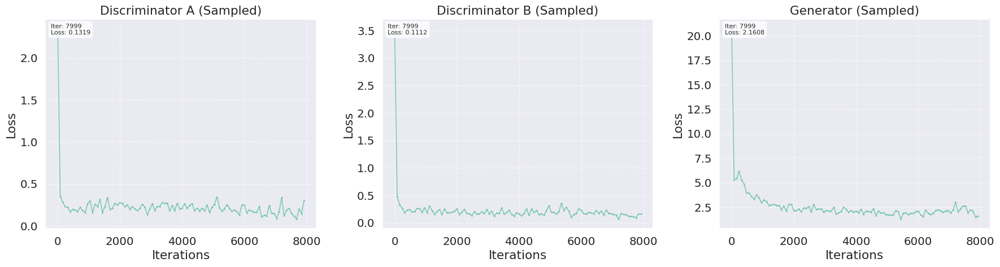

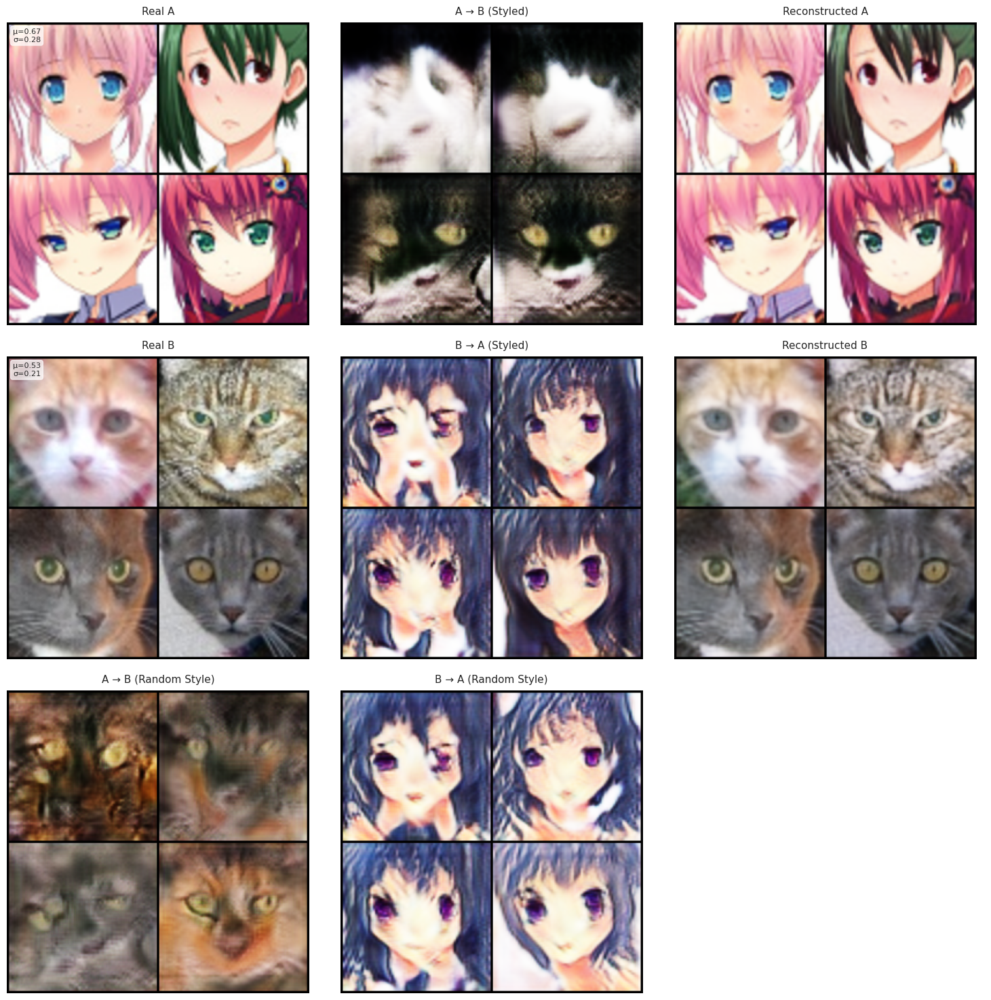

Training completed!


In [22]:
munit_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,    
    visualize_interval=visualize_interval
)

**4.** Единой метрики для оценки качества решения задачи трансфера стиля сейчас не существует. Поэтому попробуем оценить качество модели следующим образом.
* Просемплируйте 1000 изображений аниме и 1000 изображений котов. Сгенерируйте соответствущие изображения из противоположного домена.
* Посчитайте FID для реальных и сгенерированных изображений аниме и котов. В итоге должно получиться 2 значения FID, соотв. двум доменам.
* Посчитайте метрику LPIPS между исходными и сгенерированными изображениями для обоих доменов. Таким образом получится 2 значения для обоих доменов. LPIPS оценивает сходство активаций сети между двумя изображениями. Чем меньше эта метрика, тем меньше расстояние между изображениями. Вам поможет реализация метрики [`LearnedPerceptualImagePatchSimilarity`](https://torchmetrics.readthedocs.io/en/stable/image/learned_perceptual_image_patch_similarity.html) из `torchmetrics`. В качестве backbone сети изпользуйте VGG, для этого установите параметр `net_type='vgg'`. Обратите внимание на то, что диапазон значений изображения должно быть приведен в интервал $[-1, 1]$.

In [23]:
def compute_fid_score(real_imgs, fake_imgs, device="cuda"):
    """
    Вычисляет FID между реальными и сгенерированными изображениями.
    Ожидает тензоры в диапазоне [-1, 1] (B, C, H, W).
    Возвращает float.
    """
    fid = FrechetInceptionDistance(feature=192, normalize=True).to(device)
    real_denorm = ((real_imgs.clamp(-1, 1) + 1) / 2).to(device=device, dtype=torch.float32)
    fake_denorm = ((fake_imgs.clamp(-1, 1) + 1) / 2).to(device=device, dtype=torch.float32)
    fid.update(real_denorm, real=True)
    fid.update(fake_denorm, real=False)
    return fid.compute().item()

def compute_lpips_score(real_imgs, fake_imgs, device="cuda"):
    """
    Вычисляет LPIPS между реальными и сгенерированными изображениями.
    Ожидает тензоры в диапазоне [-1, 1].
    """
    lpips = LearnedPerceptualImagePatchSimilarity(net_type="vgg").to(device)
    real_imgs = real_imgs.to(device)
    fake_imgs = fake_imgs.to(device)
    score = lpips(real_imgs, fake_imgs)
    return score.item()

def calculate_metrics(
    model,
    train_loader_A,
    train_loader_B,
    device="cuda",
    n_A_samples=10,
    n_B_samples=10,
):
    model.eval()
    A2B_real_samples, A2B_fake_samples = [], []
    B2A_real_samples, B2A_fake_samples = [], []

    with torch.no_grad():
        train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)
        while len(A2B_fake_samples) < n_A_samples or len(B2A_fake_samples) < n_B_samples:
            print(f"{len(A2B_fake_samples)}/{n_A_samples}, {len(B2A_fake_samples)}/{n_B_samples}", end="\r")

            try:
                real_A, _ = next(train_iter_A)
                real_B, _ = next(train_iter_B)
            except StopIteration:
                train_iter_A, train_iter_B = iter(train_loader_A), iter(train_loader_B)
                continue

            real_A = real_A.to(device)
            real_B = real_B.to(device)

            result_dict = model.sample(real_A, real_B)
            fake_B = result_dict["fake_B"].detach()
            fake_A = result_dict["fake_A"].detach()

            A2B_real_samples.append(real_B)
            A2B_fake_samples.append(fake_B)
            B2A_real_samples.append(real_A)
            B2A_fake_samples.append(fake_A)

            if len(A2B_fake_samples) >= n_A_samples and len(B2A_fake_samples) >= n_B_samples:
                break

    real_A_cat = torch.cat(B2A_real_samples, dim=0)[:n_B_samples]
    fake_A_cat = torch.cat(B2A_fake_samples, dim=0)[:n_B_samples]
    real_B_cat = torch.cat(A2B_real_samples, dim=0)[:n_A_samples]
    fake_B_cat = torch.cat(A2B_fake_samples, dim=0)[:n_A_samples]

    fid_A2B = compute_fid_score(real_B_cat, fake_B_cat, device=device)
    fid_B2A = compute_fid_score(real_A_cat, fake_A_cat, device=device)
    lpips_A2B = compute_lpips_score(real_B_cat, fake_B_cat, device=device)
    lpips_B2A = compute_lpips_score(real_A_cat, fake_A_cat, device=device)

    print(f"FID A→B: {fid_A2B:.2f}")
    print(f"FID B→A: {fid_B2A:.2f}")
    print(f"LPIPS A→B: {lpips_A2B:.4f}")
    print(f"LPIPS B→A: {lpips_B2A:.4f}")

    model.train()
    return {
        "FID_A2B": fid_A2B,
        "FID_B2A": fid_B2A,
        "LPIPS_A2B": lpips_A2B,
        "LPIPS_B2A": lpips_B2A
    }

In [24]:
task_4_munit_gan_metrics = calculate_metrics(munit_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 11.44
FID B→A: 11.96
LPIPS A→B: 0.6142
LPIPS B→A: 0.6066


In [25]:
task_4_cycle_gan_metrics = calculate_metrics(cycle_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 10.25
FID B→A: 12.12
LPIPS A→B: 0.6195
LPIPS B→A: 0.6116


**5.** Последовательно проведите серию экспериментов с разными лоссами:
1. Замените циклический лосс $\mathcal{L}_{cyc}$ в CycleGAN на $\mathcal{L}_{recon}^{x}\left(\mathcal{E}_1, \mathcal{G}_1\right) + \mathcal{L}_{recon}^{x}\left(\mathcal{E}_2, \mathcal{G}_2\right)$.
2. Добавьте лоссы реконструкции латентного вектора контента.
3. Добавьте лоссы реконструкции латентного вектора стиля. Здесь мы получим модель MUNIT.
4. Попробуйте улучшить модель MUNIT. Можно, например добавить WGAN-GP компоненту в GAN-лосс или сделать что-то своё.

Во всех экспериментах используйте визуализацию аналогичную пункту 3, посчитайте итоговые метрики из пункта 4. Также очень желательно настроить соответствующие коэффициенты для компонент лоссов и подобрать оптимальную архитектуру для кодировщика стиля $\mathcal{E}^s$.

**5.1**

In [26]:
class CycleGANTrainer_ver2(CycleGANTrainer):
    def __init__(
        self,
        cycle_gan: CycleGAN,
        lr: float = 2e-4,
        beta1: float = 0.5,
        beta2: float = 0.999,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        lambda_identity: float = 0.5,
        lambda_recon: float = 10,
        num_epochs: int = 200,  # Добавляем параметр количества эпох
    ):
        super().__init__(
            cycle_gan, lr, beta1, beta2, device, lambda_identity, None, num_epochs
        )
        self.lambda_recon = lambda_recon
    
    def train_step(self, real_A, real_B):
        real_A = real_A.to(self.device)
        real_B = real_B.to(self.device)
        
        # Discriminator A
        with autocast(device_type=self.device_type):
            fake_A = self.cycle_gan.gen_B_to_A(real_B)
            D_A_real = self.cycle_gan.disc_A(real_A)
            D_A_fake = self.cycle_gan.disc_A(fake_A.detach())
            D_A_loss = (self.mse(D_A_real, torch.ones_like(D_A_real)) + 
                        self.mse(D_A_fake, torch.zeros_like(D_A_fake))) / 2
        self.opt_disc_A.zero_grad()
        self.scaler_disc_A.scale(D_A_loss).backward()
        self.scaler_disc_A.step(self.opt_disc_A)
        self.scaler_disc_A.update()
        
        # Discriminator B
        with autocast(device_type=self.device_type):
            fake_B = self.cycle_gan.gen_A_to_B(real_A)
            D_B_real = self.cycle_gan.disc_B(real_B)
            D_B_fake = self.cycle_gan.disc_B(fake_B.detach())
            D_B_loss = (self.mse(D_B_real, torch.ones_like(D_B_real)) + 
                        self.mse(D_B_fake, torch.zeros_like(D_B_fake))) / 2
        self.opt_disc_B.zero_grad()
        self.scaler_disc_B.scale(D_B_loss).backward()
        self.scaler_disc_B.step(self.opt_disc_B)
        self.scaler_disc_B.update()
        
        # Generator
        with autocast(device_type=self.device_type):
            D_A_fake = self.cycle_gan.disc_A(fake_A)
            D_B_fake = self.cycle_gan.disc_B(fake_B)
            loss_G = self.mse(D_A_fake, torch.ones_like(D_A_fake)) + self.mse(D_B_fake, torch.ones_like(D_B_fake))
            
            recon_loss = self.l1(fake_A, real_A) + self.l1(fake_B, real_B)
            
            identity_A = self.cycle_gan.gen_B_to_A(real_A)
            identity_B = self.cycle_gan.gen_A_to_B(real_B)
            identity_loss = (self.l1(identity_A, real_A) + self.l1(identity_B, real_B)) * self.lambda_identity
            
            G_loss = loss_G + recon_loss + identity_loss
        
        self.opt_gen.zero_grad()
        self.scaler_gen.scale(G_loss).backward()
        self.scaler_gen.step(self.opt_gen)
        self.scaler_gen.update()
        
        return {
            "D_A_loss": D_A_loss.item(),
            "D_B_loss": D_B_loss.item(),
            "G_loss": G_loss.item(),
        }

In [27]:
cycle_gan = CycleGAN(in_channels=3, num_features=64, num_residuals=6)
cycle_trainer = CycleGANTrainer_ver2(cycle_gan, lr=2e-4, device=device)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

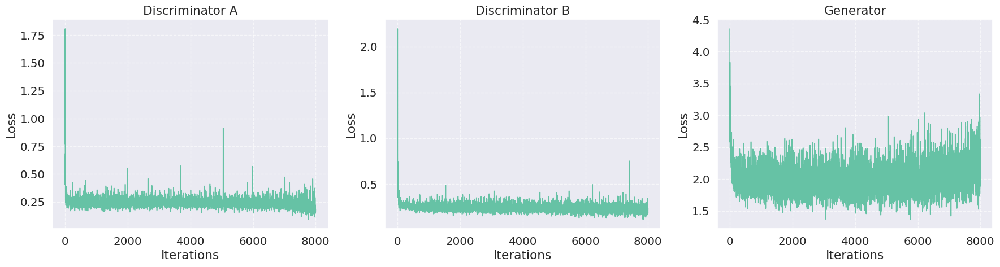

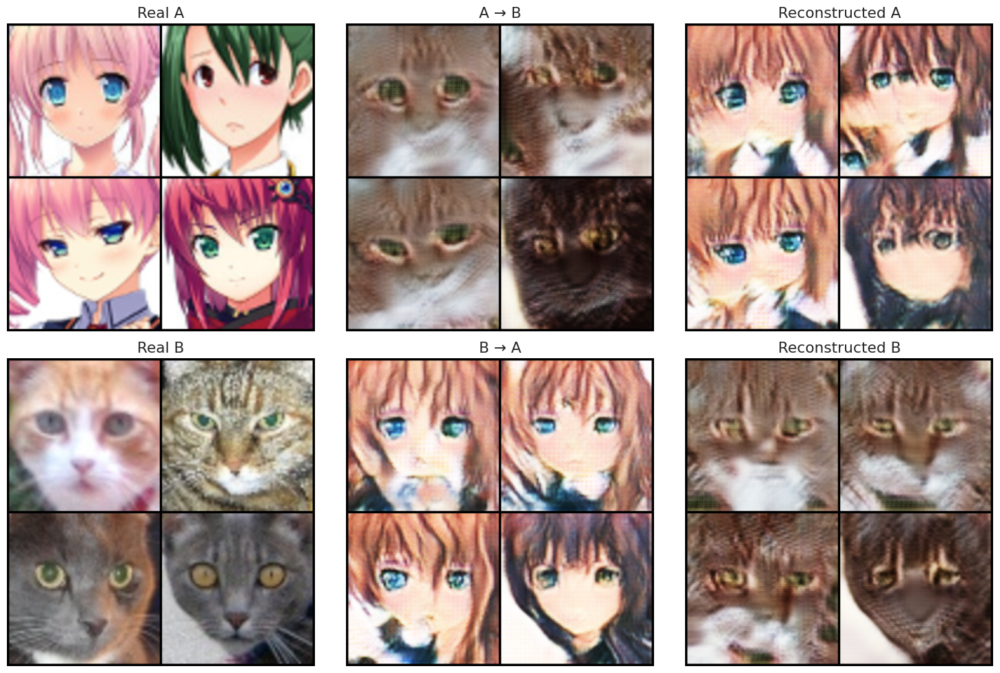

Training completed!


In [28]:
cycle_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,
    visualize_interval=visualize_interval
)

Обучение развалилось

In [29]:
task_5_1_cycle_gan_metrics = calculate_metrics(cycle_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 15.70
FID B→A: 18.80
LPIPS A→B: 0.6142
LPIPS B→A: 0.6283


**5.2**

Вместо того чтобы добавлять лосс реконуструкции контента в CycleGAN, проще просто убрать лосс реконструкции стиля из уже написанной нами реализации MUNIT, получим то же самое.

In [30]:
class MUNITTrainer_ver2(MUNITTrainer):
    def __init__(
        self,
        munit_gan: MUNIT,
        lr: float = 2e-4,
        beta1: float = 0.5,
        beta2: float = 0.999,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        lambda_identity: float = 0.5,
        lambda_content: float = 10,
        lambda_style: float = 10,
        num_epochs: int = 200,
    ):
        super().__init__(
            munit_gan,
            lr,
            beta1,
            beta2,
            device,
            lambda_identity,
            lambda_content,
            lambda_style,
            num_epochs,
        )
    def train_step(self, real_A, real_B):
        real_A = real_A.to(self.device)
        real_B = real_B.to(self.device)

        # === Train Discriminator A ===
        with autocast(self.device_type):
            fake_A = self.munit_gan.translate_B_to_A(real_B)

            D_A_real_outputs = self.munit_gan.disc_A(real_A)
            D_A_fake_outputs = self.munit_gan.disc_A(fake_A.detach())

            D_A_loss = 0
            for real_out, fake_out in zip(D_A_real_outputs, D_A_fake_outputs):
                D_A_loss += (
                    F.mse_loss(real_out, torch.ones_like(real_out)) +
                    F.mse_loss(fake_out, torch.zeros_like(fake_out))
                ) * 0.5
            D_A_loss = D_A_loss / len(D_A_real_outputs)

        self.opt_disc_A.zero_grad()
        self.scaler_disc_A.scale(D_A_loss).backward()
        self.scaler_disc_A.step(self.opt_disc_A)
        self.scaler_disc_A.update()

        # === Train Discriminator B ===
        with autocast(self.device_type):
            fake_B = self.munit_gan.translate_A_to_B(real_A)
            D_B_real_outputs = self.munit_gan.disc_B(real_B)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B.detach())

            D_B_loss = 0
            for real_out, fake_out in zip(D_B_real_outputs, D_B_fake_outputs):
                D_B_loss += (
                    F.mse_loss(real_out, torch.ones_like(real_out)) +
                    F.mse_loss(fake_out, torch.zeros_like(fake_out))
                ) * 0.5
            D_B_loss = D_B_loss / len(D_B_real_outputs)

        self.opt_disc_B.zero_grad()
        self.scaler_disc_B.scale(D_B_loss).backward()
        self.scaler_disc_B.step(self.opt_disc_B)
        self.scaler_disc_B.update()

        # === Train Generator ===
        with autocast(self.device_type):
            fake_A, fake_B, recon_A, recon_B = self.munit_gan(real_A, real_B)

            # Reconstruction losses
            L_x_recon_A = self.l1(recon_A, real_A)
            L_x_recon_B = self.l1(recon_B, real_B)
            recon_loss = L_x_recon_A + L_x_recon_B

            # Content and style losses
            content_A, style_A = self.munit_gan.encoder_A(real_A)
            content_B, style_B = self.munit_gan.encoder_B(real_B)

            recon_content_A, _ = self.munit_gan.encoder_A(recon_A)
            recon_content_B, _ = self.munit_gan.encoder_B(recon_B)
            content_loss = self.l1(recon_content_A, content_A) + self.l1(recon_content_B, content_B)

            # _, recon_style_A = self.munit_gan.encoder_A(recon_A)
            # _, recon_style_B = self.munit_gan.encoder_B(recon_B)
            # style_loss = self.l1(recon_style_A, style_A) + self.l1(recon_style_B, style_B)

            D_A_fake_outputs = self.munit_gan.disc_A(fake_A)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B)

            G_adv_loss = 0
            for fake_out_A, fake_out_B in zip(D_A_fake_outputs, D_B_fake_outputs):
                G_adv_loss += (
                    F.mse_loss(fake_out_A, torch.ones_like(fake_out_A)) +
                    F.mse_loss(fake_out_B, torch.ones_like(fake_out_B))
                )
            G_adv_loss = G_adv_loss / len(D_A_fake_outputs)

            G_loss = (
                G_adv_loss
                + self.lambda_identity * recon_loss
                + self.lambda_content * content_loss
                # + self.lambda_style * style_loss
            )

        self.opt_gen.zero_grad()
        self.scaler_gen.scale(G_loss).backward()
        self.scaler_gen.step(self.opt_gen)
        self.scaler_gen.update()

        return {
            "D_A_loss": D_A_loss.item(),
            "D_B_loss": D_B_loss.item(),
            "G_loss": G_loss.item(),
        }


In [31]:
munit_gan = MUNIT(device=device, num_residuals=4, num_features=64, style_dim=64)
munit_trainer = MUNITTrainer_ver2(
    munit_gan,
    lr=1e-4,
    device=device,
    lambda_identity=10,
    lambda_content=1,
    lambda_style=1,
)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

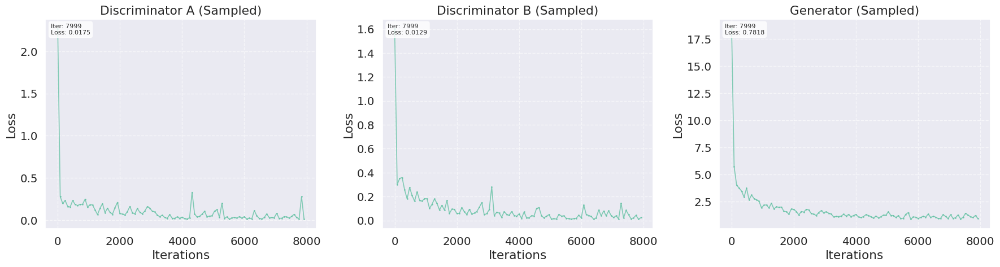

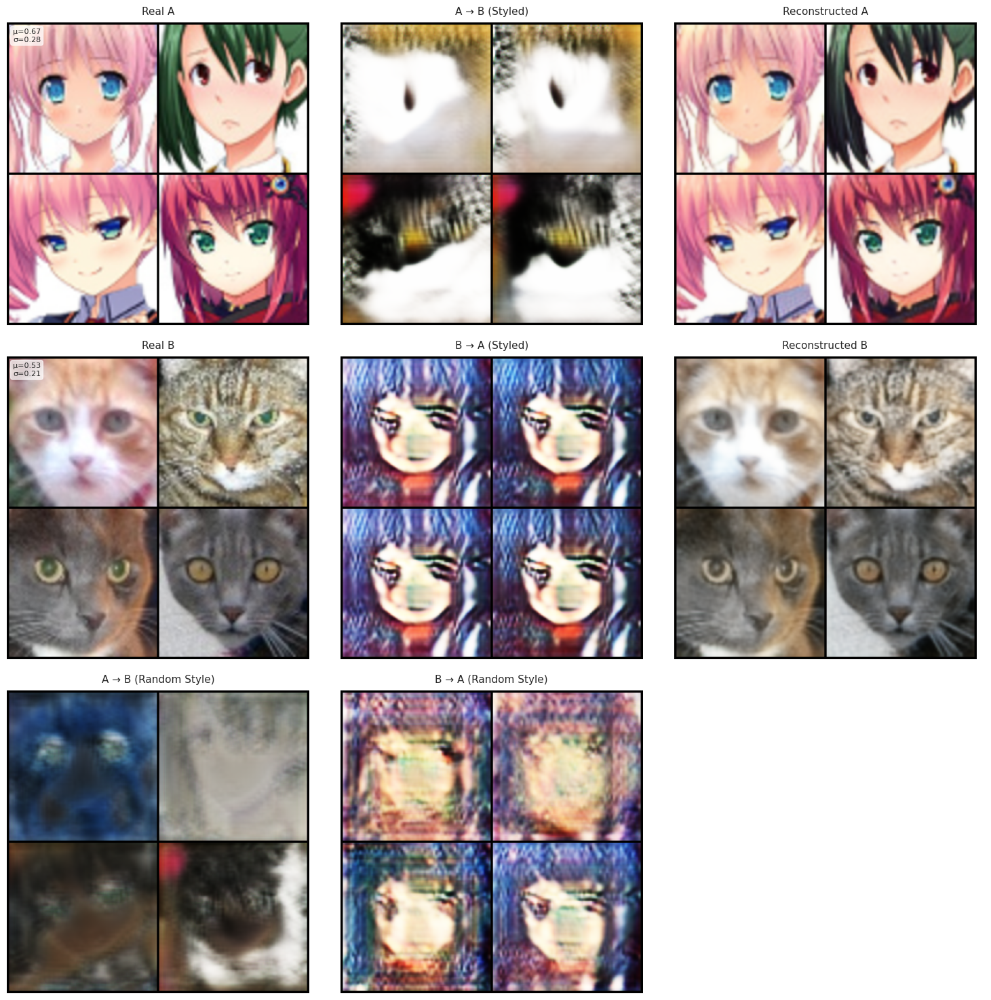

Training completed!


In [32]:
munit_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,    
    visualize_interval=visualize_interval
)

Контента явно не хватает, но стиль вроде передался

In [33]:
task_5_2_munit_gan_metrics = calculate_metrics(munit_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 24.04
FID B→A: 21.42
LPIPS A→B: 0.6638
LPIPS B→A: 0.6470


**5.3**

Мы уже написали MUNIT в пункте 3.

In [34]:
munit_gan = MUNIT(device=device, num_residuals=4, num_features=64, style_dim=64)
munit_trainer = MUNITTrainer(
    munit_gan,
    lr=1e-4,
    device=device,
    lambda_identity=10,
    lambda_content=1,
    lambda_style=1,
)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

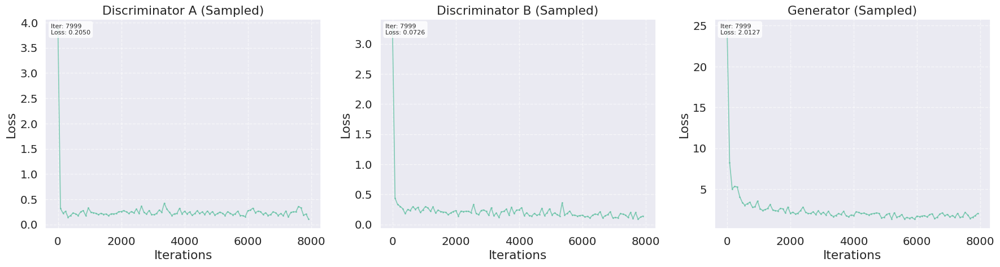

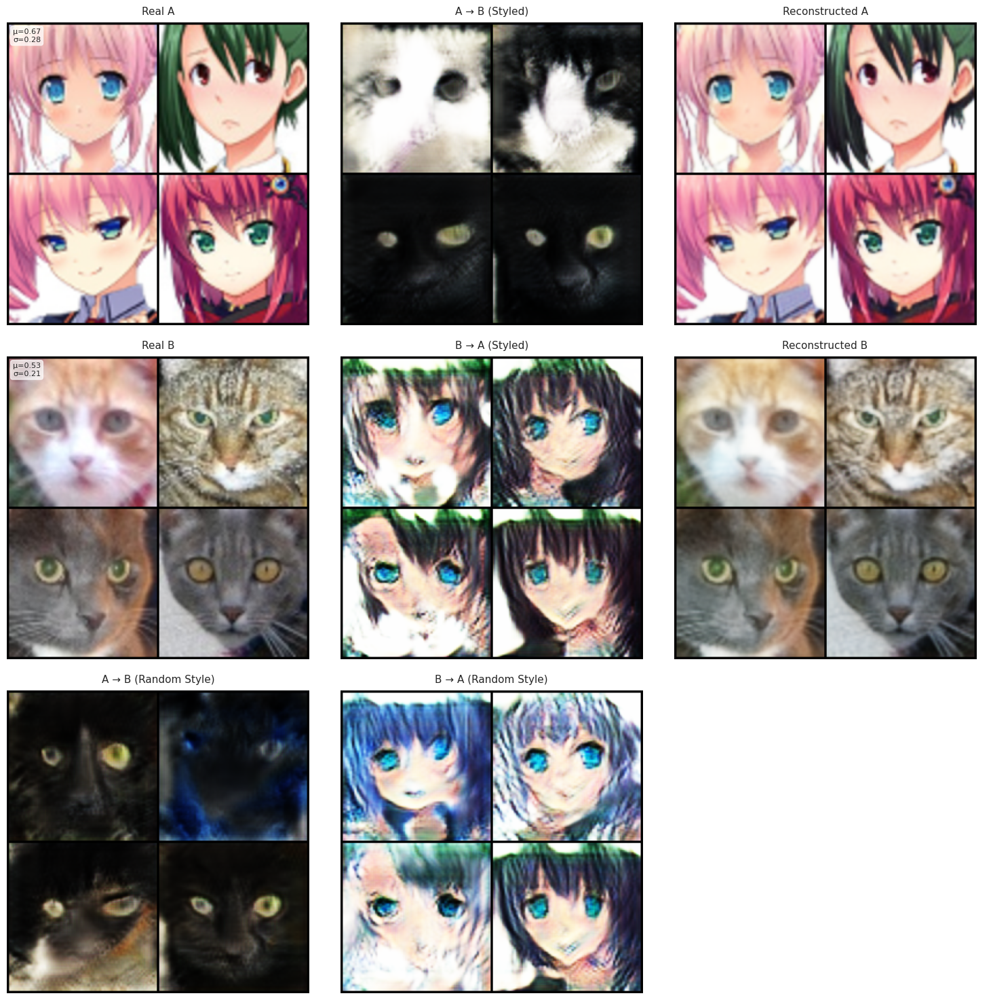

Training completed!


In [35]:
munit_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,    
    visualize_interval=visualize_interval
)

In [36]:
task_5_3_munit_gan_metrics = calculate_metrics(munit_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 45.70
FID B→A: 24.86
LPIPS A→B: 0.6100
LPIPS B→A: 0.6684


**5.4**

Для начала уберем tanh на выходе декодера -- в WGAN-GP выходы не должны быть ограниченными

In [37]:
class Decoder_WGAN_GP(Decoder):
    def __init__(self, out_channels=3, dim=64, n_residual=3, n_upsample=2, style_dim=8):
        super().__init__(out_channels=out_channels, dim=dim, n_residual=n_residual, n_upsample=n_upsample)

        layers = []
        dim = dim * 2 ** n_upsample
        # Residual blocks
        for _ in range(n_residual):
            layers += [ResidualBlock(dim, norm="adain")]

        # Upsampling
        for _ in range(n_upsample):
            layers += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(dim, dim // 2, 5, stride=1, padding=2),
                LayerNorm(dim // 2),
                nn.ReLU(inplace=True),
            ]
            dim = dim // 2

        # Output layer
        layers += [nn.ReflectionPad2d(3), nn.Conv2d(dim, out_channels, 7)]

        self.model = nn.Sequential(*layers)

        # Initiate mlp (predicts AdaIN parameters)
        num_adain_params = self.get_num_adain_params()
        self.mlp = MLP(style_dim, num_adain_params)


In [38]:
class MUNIT_v2(MUNIT):
    def __init__(
        self,
        in_channels: int = 3,
        num_features: int = 64,
        num_residuals: int = 4,
        style_dim: int = 64,
        device="cuda",
    ):
        super().__init__(in_channels, num_features, num_residuals, style_dim, device)

        self.dec_A = Decoder_WGAN_GP(
            out_channels=in_channels,
            dim=num_features,
            n_residual=num_residuals,
            n_upsample=2,
            style_dim=style_dim,
        )
        self.dec_B = Decoder_WGAN_GP(
            out_channels=in_channels,
            dim=num_features,
            n_residual=num_residuals,
            n_upsample=2,
            style_dim=style_dim,
        )

        self.apply(weights_init_normal)

    def forward(self, x_A, x_B):
        """Прямой проход для обучения"""
        content_A, style_A = self.encoder_A(x_A)
        content_B, style_B = self.encoder_B(x_B)

        fake_A = self.dec_A(content_B, style_A)
        fake_B = self.dec_B(content_A, style_B)

        recon_A = self.dec_A(content_A, style_A)
        recon_B = self.dec_B(content_B, style_B)

        return fake_A, fake_B, recon_A, recon_B

    def translate_A_to_B(self, x_A, style_B=None):
        """Перевод изображения из домена A → B"""
        content_A, _ = self.encoder_A(x_A)
        if style_B is None:
            style_B = torch.randn(x_A.size(0), self.style_dim, device=self.device)
        fake_B = self.dec_B(content_A, style_B)
        return torch.tanh(fake_B)

    def translate_B_to_A(self, x_B, style_A=None):
        """Перевод изображения из домена B → A"""
        content_B, _ = self.encoder_B(x_B)
        if style_A is None:
            style_A = torch.randn(x_B.size(0), self.style_dim, device=self.device)
        fake_A = self.dec_A(content_B, style_A)
        return torch.tanh(fake_A)

    def sample(self, x_A, x_B, num_samples=4):
        """Создаёт примеры перевода с разными стилями (короткая версия для метрик)"""
        with torch.no_grad():
            self.eval()

            x_A = x_A[:num_samples].to(self.device)
            x_B = x_B[:num_samples].to(self.device)

            content_A, _ = self.encoder_A(x_A)
            content_B, _ = self.encoder_B(x_B)

            style_A_rand = torch.randn(num_samples, self.style_dim, device=self.device)
            style_B_rand = torch.randn(num_samples, self.style_dim, device=self.device)

            fake_B = self.dec_B(content_A, style_B_rand)
            fake_A = self.dec_A(content_B, style_A_rand)

            fake_B = torch.tanh(fake_B)
            fake_A = torch.tanh(fake_A)

            self.train()
            return {"fake_A": fake_A, "fake_B": fake_B}

In [39]:
def gradient_penalty(discriminator, real_data, fake_data):
    batch_size = real_data.size(0)

    if real_data.dim() == 4:
        epsilon = torch.rand(batch_size, 1, 1, 1, device=real_data.device)
    else:
        epsilon_shape = [batch_size] + [1] * (real_data.dim() - 1)
        epsilon = torch.rand(*epsilon_shape, device=real_data.device)

    interpolated = epsilon * real_data + (1 - epsilon) * fake_data
    interpolated.requires_grad_(True)

    preds = discriminator(interpolated)

    grads_penalties = []
    for pred in preds:
        grad_outputs = torch.ones_like(pred)
        grads = torch.autograd.grad(
            outputs=pred,
            inputs=interpolated,
            grad_outputs=grad_outputs,
            create_graph=True,
            retain_graph=True,
            only_inputs=True,
        )[0]
        grads = grads.view(batch_size, -1)
        grad_norm = grads.norm(2, dim=1)
        grads_penalties.append(((grad_norm - 1) ** 2).mean())

    gp = sum(grads_penalties) / len(grads_penalties)
    return gp


In [40]:
class MUNITTrainer_ver3(MUNITTrainer):
    def __init__(
        self,
        munit_gan: MUNIT_v2,
        lr: float = 2e-4,
        beta1: float = 0.5,
        beta2: float = 0.999,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        lambda_identity: float = 0.5,
        lambda_content: float = 10,
        lambda_style: float = 10,
        lambda_gp: float = 10,
        num_epochs: int = 200,
    ):
        super().__init__(
            munit_gan,
            lr,
            beta1,
            beta2,
            device,
            lambda_identity,
            lambda_content,
            lambda_style,
            num_epochs,
        )
        self.lambda_gp = lambda_gp
        
    def train_step(self, real_A, real_B):
        real_A = real_A.to(self.device)
        real_B = real_B.to(self.device)

        # === Train Discriminator A ===
        with autocast(self.device_type):
            fake_A = self.munit_gan.translate_B_to_A(real_B)

            D_A_real_outputs = self.munit_gan.disc_A(real_A)
            D_A_fake_outputs = self.munit_gan.disc_A(fake_A.detach())

            D_A_real = sum([torch.mean(out) for out in D_A_real_outputs]) / len(D_A_real_outputs)
            D_A_fake = sum([torch.mean(out) for out in D_A_fake_outputs]) / len(D_A_fake_outputs)

            loss_WGAN = D_A_fake - D_A_real

            gp = gradient_penalty(self.munit_gan.disc_A, real_A, fake_A)
            D_A_loss = loss_WGAN + self.lambda_gp * gp   #WGAN_GP_Loss

        self.opt_disc_A.zero_grad()
        self.scaler_disc_A.scale(D_A_loss).backward()
        self.scaler_disc_A.step(self.opt_disc_A)
        self.scaler_disc_A.update()

        # === Train Discriminator B ===
        with autocast(self.device_type):
            fake_B = self.munit_gan.translate_A_to_B(real_A)

            D_B_real_outputs = self.munit_gan.disc_B(real_B)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B.detach())

            D_B_real = sum([torch.mean(out) for out in D_B_real_outputs]) / len(D_B_real_outputs)
            D_B_fake = sum([torch.mean(out) for out in D_B_fake_outputs]) / len(D_B_fake_outputs)

            loss_WGAN = D_B_fake - D_B_real
            gp = gradient_penalty(self.munit_gan.disc_B, real_B, fake_B)
            D_B_loss = loss_WGAN + self.lambda_gp * gp   #WGAN_GP_Loss

        self.opt_disc_B.zero_grad()
        self.scaler_disc_B.scale(D_B_loss).backward()
        self.scaler_disc_B.step(self.opt_disc_B)
        self.scaler_disc_B.update()

        # === Train Generator ===
        with autocast(self.device_type):
            fake_A, fake_B, recon_A, recon_B = self.munit_gan(real_A, real_B)

            # Reconstruction losses
            L_x_recon_A = self.l1(recon_A, real_A)
            L_x_recon_B = self.l1(recon_B, real_B)
            recon_loss = L_x_recon_A + L_x_recon_B

            # Content and style losses
            content_A, style_A = self.munit_gan.encoder_A(real_A)
            content_B, style_B = self.munit_gan.encoder_B(real_B)

            recon_content_A, _ = self.munit_gan.encoder_A(recon_A)
            recon_content_B, _ = self.munit_gan.encoder_B(recon_B)
            content_loss = self.l1(recon_content_A, content_A) + self.l1(recon_content_B, content_B)

            _, recon_style_A = self.munit_gan.encoder_A(recon_A)
            _, recon_style_B = self.munit_gan.encoder_B(recon_B)
            style_loss = self.l1(recon_style_A, style_A) + self.l1(recon_style_B, style_B)

            D_A_fake_outputs = self.munit_gan.disc_A(fake_A)
            D_B_fake_outputs = self.munit_gan.disc_B(fake_B)

            G_adv_loss = 0
            for fake_out_A, fake_out_B in zip(D_A_fake_outputs, D_B_fake_outputs):
                G_adv_loss += (-torch.mean(fake_out_A) - torch.mean(fake_out_B))
            G_adv_loss /= len(D_A_fake_outputs)

            G_loss = (
                G_adv_loss
                + self.lambda_identity * recon_loss
                + self.lambda_content * content_loss
                + self.lambda_style * style_loss
            )

        self.opt_gen.zero_grad()
        self.scaler_gen.scale(G_loss).backward()
        self.scaler_gen.step(self.opt_gen)
        self.scaler_gen.update()

        return {
            "D_A_loss": D_A_loss.item(),
            "D_B_loss": D_B_loss.item(),
            "G_loss": G_loss.item(),
        }


In [41]:
munit_gan = MUNIT_v2(device=device, num_residuals=4, num_features=64, style_dim=64)
munit_trainer = MUNITTrainer_ver3(
    munit_gan,
    lr=2e-4,
    device=device,
    lambda_identity=10,
    lambda_content=1,
    lambda_style=1,
    lambda_gp=1
)
num_iter = NUM_ITER
visualize_interval = NUM_ITER // 20

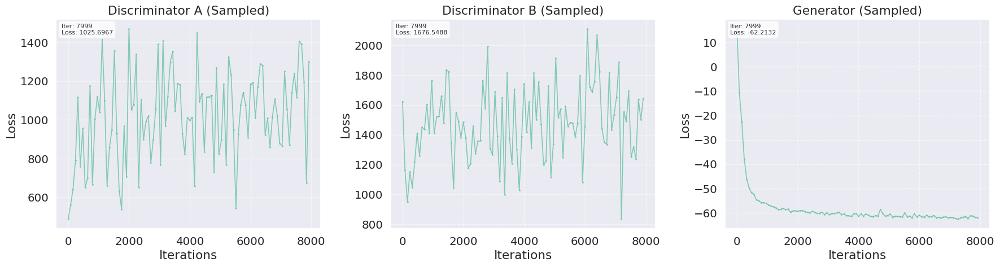

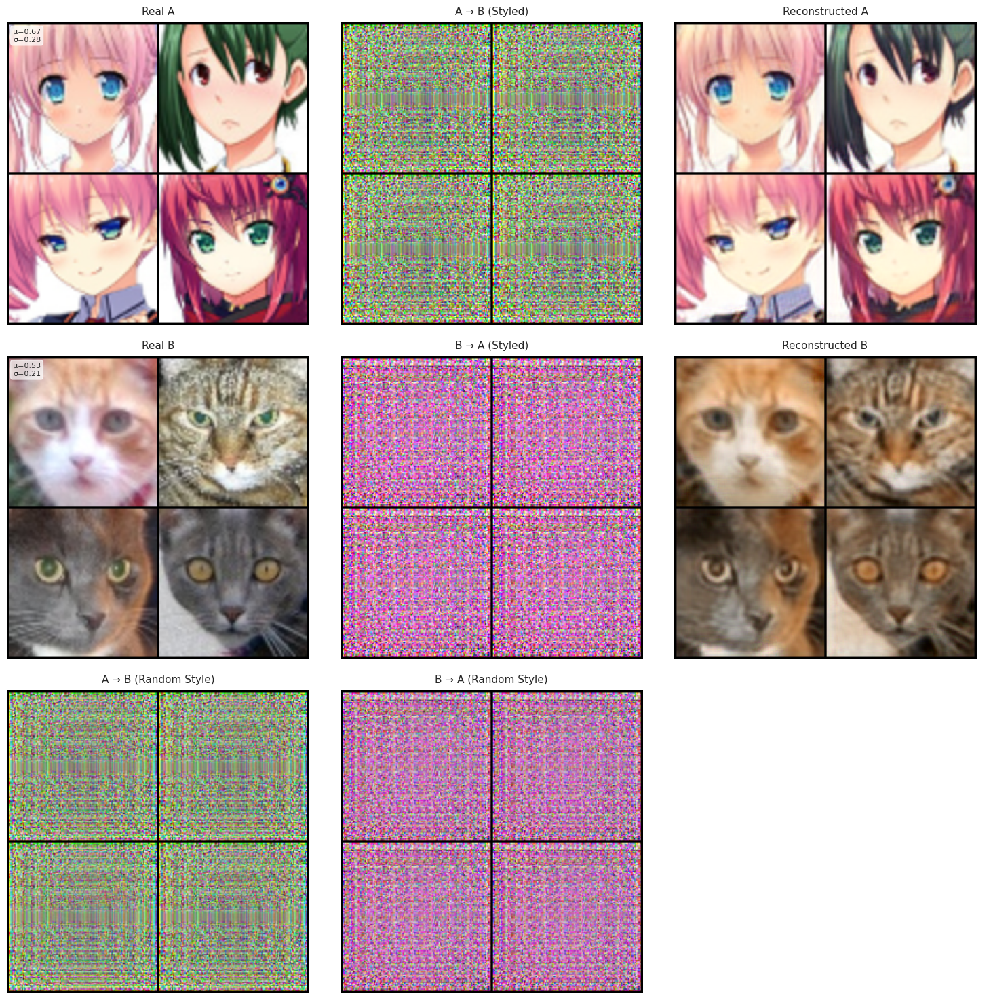

Training completed!


In [42]:
munit_trainer.train(
    train_loader_A=anime_train_loader,
    train_loader_B=cats_train_loader,
    val_loader_A=anime_val_loader,
    val_loader_B=cats_val_loader,
    num_iterations=num_iter,    
    visualize_interval=visualize_interval
)

In [43]:
task_5_4_munit_gan_metrics = calculate_metrics(munit_gan, anime_val_loader, cats_val_loader, device=device)

FID A→B: 282.55
FID B→A: 288.03
LPIPS A→B: 0.8326
LPIPS B→A: 0.8394


**6.** Представьте метрики в виде таблицы и виде barplot-ов (для удобства сравнения). Сделайте выводы об эффективности различных компонент лоссов и не только в задаче трансфера стиля.

In [59]:
def plot_metric_comparison(data_list):
    metrics = ["FID_A2B", "FID_B2A", "LPIPS_A2B", "LPIPS_B2A"]
    names = [d[0] for d in data_list]
    metric_dicts = [d[1] for d in data_list]

    colors = plt.cm.tab10(np.linspace(0, 1, len(data_list)))

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()

    for i, metric in enumerate(metrics):
        ax = axes[i]
        values = [m[metric] for m in metric_dicts]
        x = np.arange(len(values))
        ax.bar(x, values, color=colors)
        ax.set_title(metric.replace("_", " "))
        ax.set_xticks([])
        ax.grid(axis='y', linestyle='--', alpha=0.6)
        ax.set_ylabel(metric.split("_")[0])
        if "FID" in metric:
            ax.set_ylim(0, 50)

    # легенда с названиями моделей и их цветами
    fig.legend([plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
               names, loc='upper center', ncol=len(data_list))

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [60]:
data_list = [
    ("CycleGAN", task_4_cycle_gan_metrics),
    ("CycleGAN + recon Loss", task_5_1_cycle_gan_metrics),
    ("CycleGAN + content Loss", task_5_2_munit_gan_metrics),
    ("MUNIT", task_5_3_munit_gan_metrics),
    ("MUNIT + WGAN-GP", task_5_4_munit_gan_metrics)
]

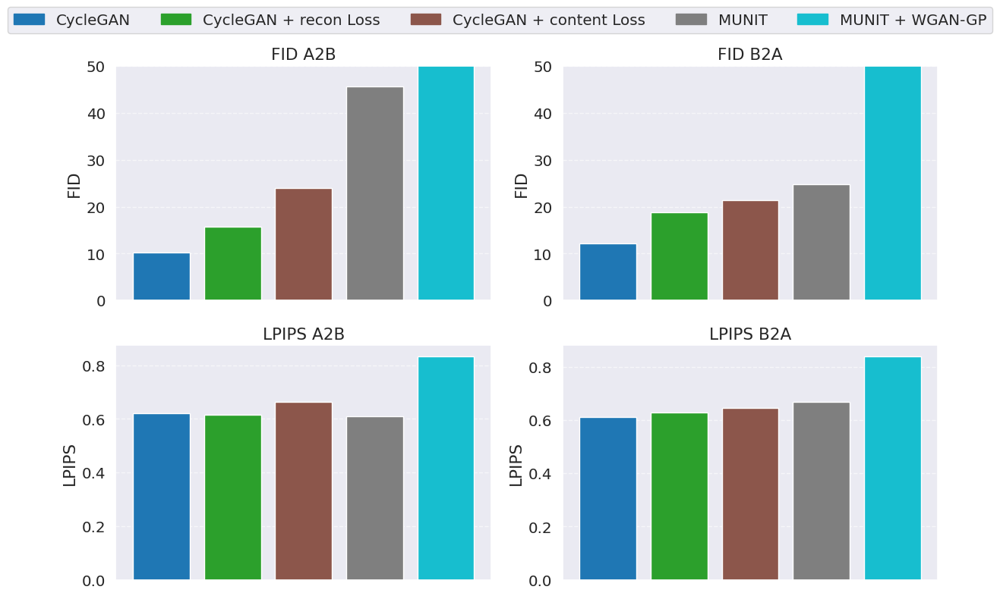

In [61]:
plot_metric_comparison(data_list)

**Выводы:**

В работе мы реализовали достаточно непростые архитектуры вроде CycleGAN и MUNIT. 

Сразу можно сказать, что MUNIT восстанавливает изображения в целом лучше.

Но в другое пространство все же лучше переносит CycleGAN, что отлично видно по графикам. Возможно MUNIT недоучился, но учить его дольше слишком времязатратно.

---
© 2025 команда <a href="https://thetahat.ru/">ThetaHat</a> для DS-потока